## Compare Grit to perturbseq Relative Activity Score

The perturbseq data come from the CRISPRi experiment from:

> Jost, M., Santos, D.A., Saunders, R.A. et al. Titrating gene expression using libraries of systematically attenuated CRISPR guide RNAs. Nat Biotechnol 38, 355–364 (2020). https://doi.org/10.1038/s41587-019-0387-5

and relative activity is defined as:

The fold-knockdown of each mismatched variant divided by the fold-knockdown of the perfectly-matched sgRNA.

### Also, visualize singlecell-grit

In [11]:
import pathlib
import numpy as np
import pandas as pd
import plotnine as gg
import statsmodels.api as sm

import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams["font.family"] = ["Roboto"]
plt.rcParams["font.size"] = 14

In [2]:
# Load perturbseq results
perturbseq_results_dir = pathlib.Path("../../1.calculate-metrics/perturb-seq/results")

gse_id = "GSE132080"
results_file = pathlib.Path(f"{perturbseq_results_dir}/{gse_id}_map.tsv")

output_dir = "figures"

bulk_grit_df = pd.read_csv(results_file, sep="\t")

bulk_grit_df["-log10(p-value)"] = -np.log10(bulk_grit_df["p_value"])
bulk_grit_df.loc[:, "gene"] = pd.Categorical(bulk_grit_df.gene, categories=bulk_grit_df.gene.unique())

print(bulk_grit_df.shape)
bulk_grit_df.head(2)

(103, 14)


,perturbation,Metadata_gene_identity,mean_ap,p_value,n_pos_pairs,n_total_pairs,id,sequence,gene,gamma_day5,gamma_day10,relative_activity_day5,relative_activity_day10,-log10(p-value)
0,ALDOA_ALDOA_+_30077139.23-P1P2_00,ALDOA,0.498893,0.416058,4.0,14.0,ALDOA_+_30077139.23-P1P2_00,GGTCACCAGGACCCCTTCTG,ALDOA,-0.412746,-0.366469,1.000000,1.000000,0.380846
1,ALDOA_ALDOA_+_30077139.23-P1P2_06,ALDOA,0.448135,0.508774,4.0,14.0,ALDOA_+_30077139.23-P1P2_06,GGTCACCAGGATCCCTTCTG,ALDOA,-0.396687,-0.348503,0.961091,0.950977,0.293475


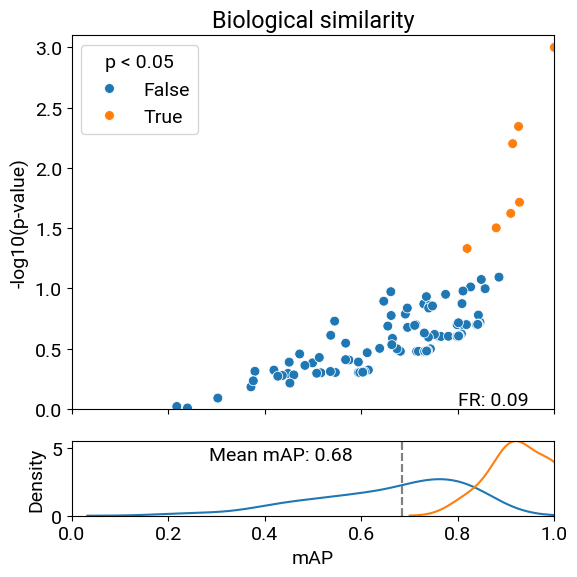

In [3]:
bulk_grit_df.rename(columns={"mean_ap": "mAP"}, inplace=True)
bulk_grit_df["p < 0.05"] = bulk_grit_df["p_value"] < 0.05


df = bulk_grit_df

def remove_inner_ticklabels(fig: plt.Figure):
    """
    Remove inner ticklabels from a figure.

    Parameters
    ----------
    fig : matplotlib.figure.Figure
        Figure to remove inner ticklabels from.
    """
    for ax in fig.axes:
        try:
            ax.label_outer()
        except AttributeError:
            pass


fig, axes = plt.subplots(2, 1, figsize=(6, 6), gridspec_kw={'height_ratios': [5, 1]})

mean_map = df['mAP'].mean()
fr = df['p < 0.05'].mean()
sns.scatterplot(
    ax=axes[0], 
    data=df, 
    x='mAP', 
    y='-log10(p-value)', 
    hue='p < 0.05',
    s=50
)
axes[0].set_title("Biological similarity")
axes[0].text(0.8, 0.01, f"FR: {fr:.2f}", transform=axes[0].transAxes)

axes[0].set_xlabel("")
axes[0].set_ylim(0, max(df['-log10(p-value)'])+0.1)
sns.move_legend(axes[0], "upper left")

# Second Row: KDE plots
max_kde_y = 0
mean_map = df['mAP'].mean()
for p_value in df['p < 0.05'].unique():
    ax = sns.kdeplot(
        ax=axes[1],
        data=df[df['p < 0.05'] == p_value],
        x='mAP', 
        label=str(p_value)
    )
    max_kde_y = max(max_kde_y, max(ax.lines[-1].get_ydata()))
    axes[1].axvline(mean_map, color='grey', linestyle='--')
# axes[1].set_ylabel("")
axes[1].set_ylim(0, max_kde_y)
axes[1].text(mean_map-0.4, 0.75, f"Mean mAP: {mean_map:.2f}", transform=axes[1].transAxes)

for ax in axes.flat:
    ax.set_xlim(0, 1)  # Set x-axis limit to 0-1 for all subplots

remove_inner_ticklabels(fig)
plt.tight_layout()
plt.show()


/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 4 x 3.5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/GSE132080_crispri_map_relative_activity_comparison.png


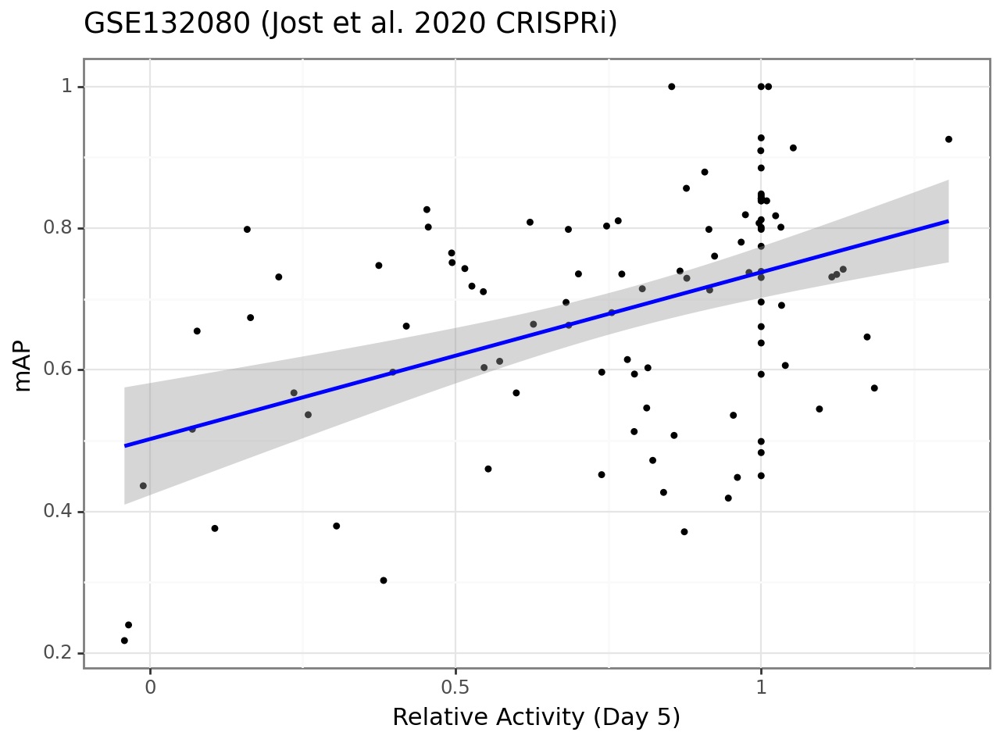

<Figure Size: (640 x 480)>

In [4]:

X = bulk_grit_df['relative_activity_day5']
Y = bulk_grit_df['mAP']
X = sm.add_constant(X)  # adding a constant for intercept

model = sm.OLS(Y, X).fit()
coef = model.params['relative_activity_day5']
r_squared = model.rsquared

global_gg = (
    gg.ggplot(bulk_grit_df, gg.aes(x="relative_activity_day5", y="mAP"))
    + gg.geom_point(size=0.8)
    + gg.geom_smooth(method='lm', color='blue')  # Add regression line
    # + gg.annotate('text', x=min(bulk_grit_df['relative_activity_day5']), 
    #               y=max(bulk_grit_df['mean_ap']), 
                #   label=f'coef: {coef:.2f}, $R^2$: {r_squared:.2f}', ha='left')
    + gg.theme_bw()
    + gg.xlab("Relative Activity (Day 5)")
    + gg.ylab("mAP")
    + gg.ggtitle(f"{gse_id} (Jost et al. 2020 CRISPRi)")
)

output_file = pathlib.Path(f"{output_dir}/{gse_id}_crispri_map_relative_activity_comparison.png")
global_gg.save(output_file, dpi=500, height=3.5, width=4)
global_gg


/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 4 x 3.5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/GSE132080_crispri_map_relative_activity_comparison.png


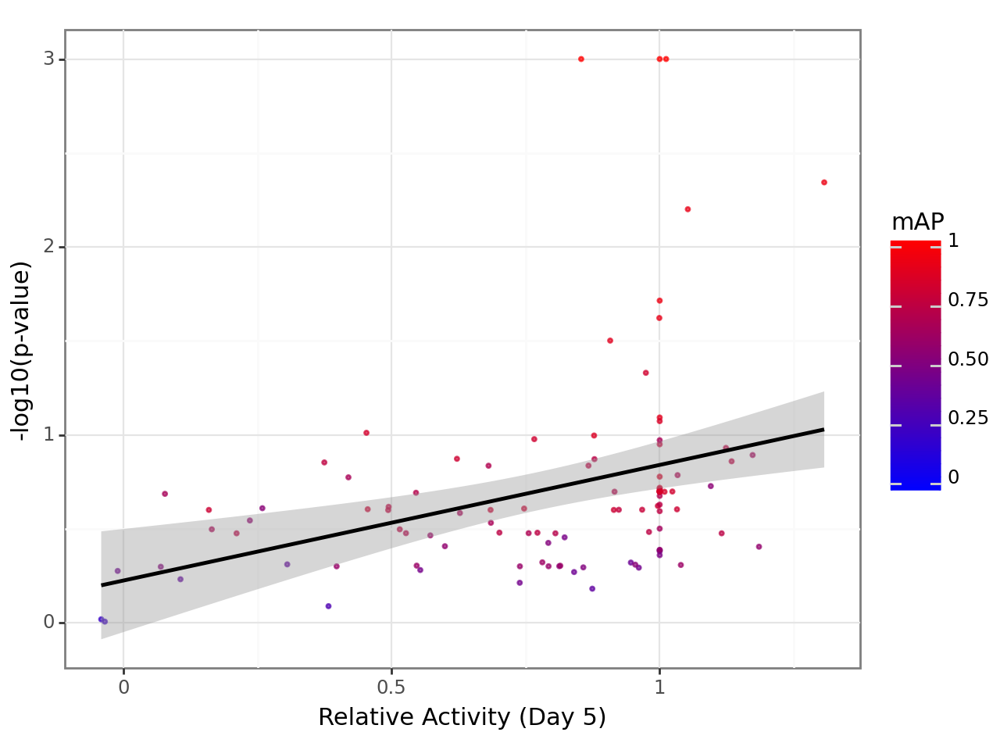

<Figure Size: (640 x 480)>

In [5]:
# Linear Regression Model
X = bulk_grit_df['relative_activity_day5']
Y = bulk_grit_df['-log10(p-value)']
X = sm.add_constant(X)  # adding a constant for intercept

model = sm.OLS(Y, X).fit()
coef = model.params['relative_activity_day5']
r_squared = model.rsquared

# Creating the plot
global_gg = (
    gg.ggplot(bulk_grit_df, gg.aes(x="relative_activity_day5", y="-log10(p-value)", color="mAP"))
    + gg.geom_point(alpha=0.7, size=0.6)  # Adjust alpha for transparency if needed
    + gg.geom_smooth(method='lm', color='black')  # Add regression line
    + gg.theme_bw()
    + gg.xlab("Relative Activity (Day 5)")
    + gg.ylab("-log10(p-value)")
    # + gg.ggtitle(f"{gse_id} (Jost et al. 2020 CRISPRi)")
    + gg.scale_color_gradient(low="blue", high="red", limits=[0, 1])  # Color gradient from blue to red
    # + gg.guides(color=gg.guide_colorbar(title="mAP"))  # Add a colorbar for color scale
)

# Specify output file path
output_file = pathlib.Path(f"{output_dir}/{gse_id}_crispri_map_relative_activity_comparison.png")

# Save the plot
global_gg.save(output_file, dpi=500, height=3.5, width=4)

# Display the plot
global_gg


/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 4 x 3.5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/GSE132080_crispri_map_relative_activity_comparison.png


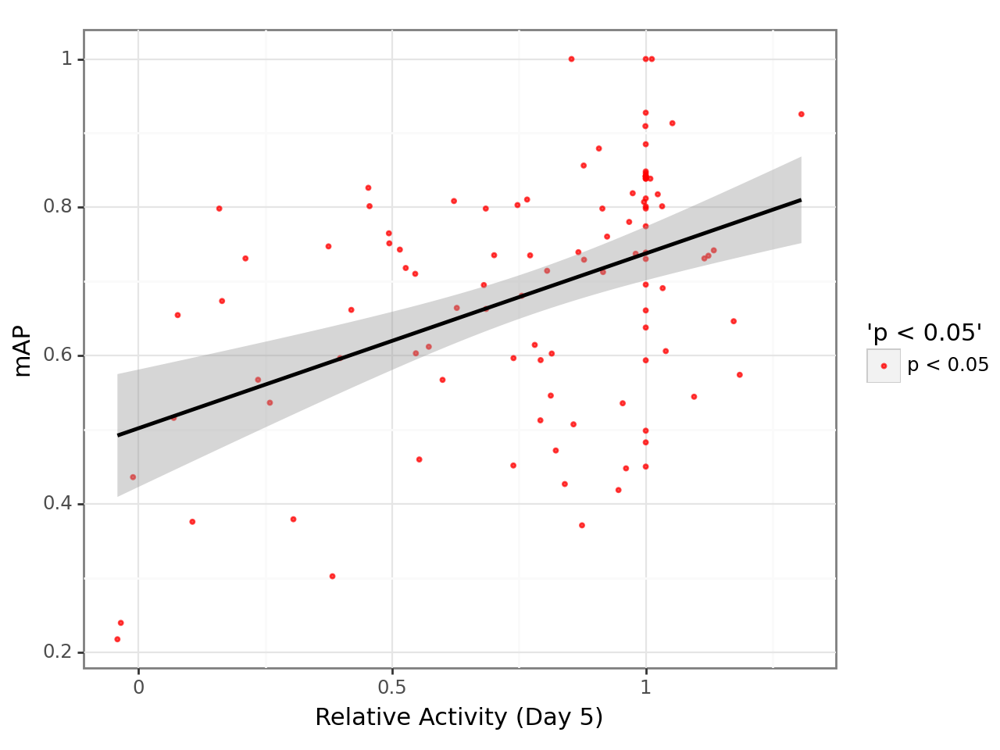

<Figure Size: (640 x 480)>

In [9]:
# Linear Regression Model
X = bulk_grit_df['relative_activity_day5']
Y = bulk_grit_df['mAP']
X = sm.add_constant(X)  # adding a constant for intercept

model = sm.OLS(Y, X).fit()
coef = model.params['relative_activity_day5']
r_squared = model.rsquared

# Creating the plot
global_gg = (
    gg.ggplot(bulk_grit_df, gg.aes(x="relative_activity_day5", y="mAP", color="'p < 0.05'"))
    + gg.geom_point(alpha=0.7, size=0.6)
    + gg.geom_smooth(method='lm', color='black')
    + gg.theme_bw()
    + gg.xlab("Relative Activity (Day 5)")
    + gg.ylab("mAP")
    + gg.scale_color_manual(values=["red", "blue"])  # Assign red to True, blue to False
)

# Specify output file path
output_file = pathlib.Path(f"{output_dir}/{gse_id}_crispri_map_relative_activity_comparison.png")

# Save the plot
global_gg.save(output_file, dpi=500, height=3.5, width=4)

# Display the plot
global_gg


/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/GSE132080_crispri_map_relative_activity_comparison.png


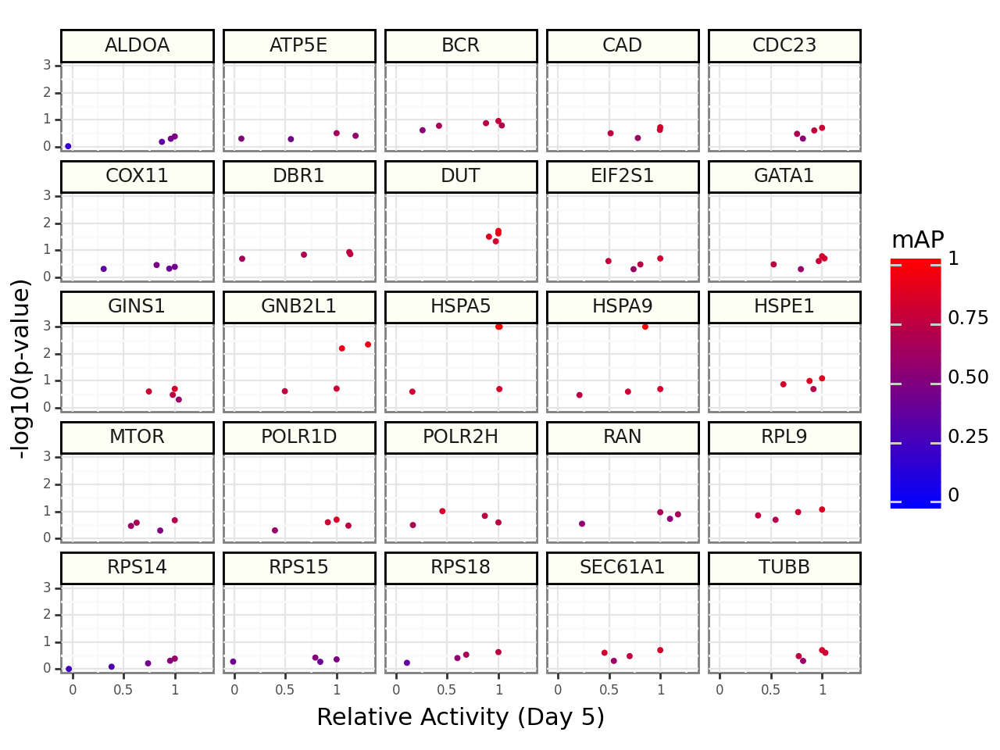

<Figure Size: (640 x 480)>

In [6]:
gene_gg = (
    gg.ggplot(bulk_grit_df, gg.aes(x="relative_activity_day5", y="-log10(p-value)", color="mAP"))
    + gg.geom_point(size=0.6)
    + gg.theme_bw()
    + gg.xlab("Relative Activity (Day 5)")
    + gg.ylab("-log10(p-value)")
    + gg.scale_color_gradient(low="blue", high="red", limits=[0, 1])  # Color gradient from blue to red
    + gg.guides(color=gg.guide_colorbar(title="mAP"))  # Add a colorbar for color scale
    # + gg.ggtitle(f"{gse_id} (Jost et al. 2020 CRISPRi)")
    + gg.facet_wrap("~gene")
    + gg.theme(
        strip_background=gg.element_rect(colour="black", fill="#fdfff4"),
        axis_text=gg.element_text(size=6),
    )
)

output_file = pathlib.Path(f"{output_dir}/{gse_id}_crispri_map_relative_activity_comparison.png")
gene_gg.save(output_file, dpi=500, height=5, width=6)

gene_gg

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/GSE132080_crispri_map_relative_activity_comparison.png
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/guides/guide_colorbar.py:73: PlotnineWarning: colorbar guide needs continuous scales
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/guides/guide_colorbar.py:73: PlotnineWarning: colorbar guide needs continuous scales


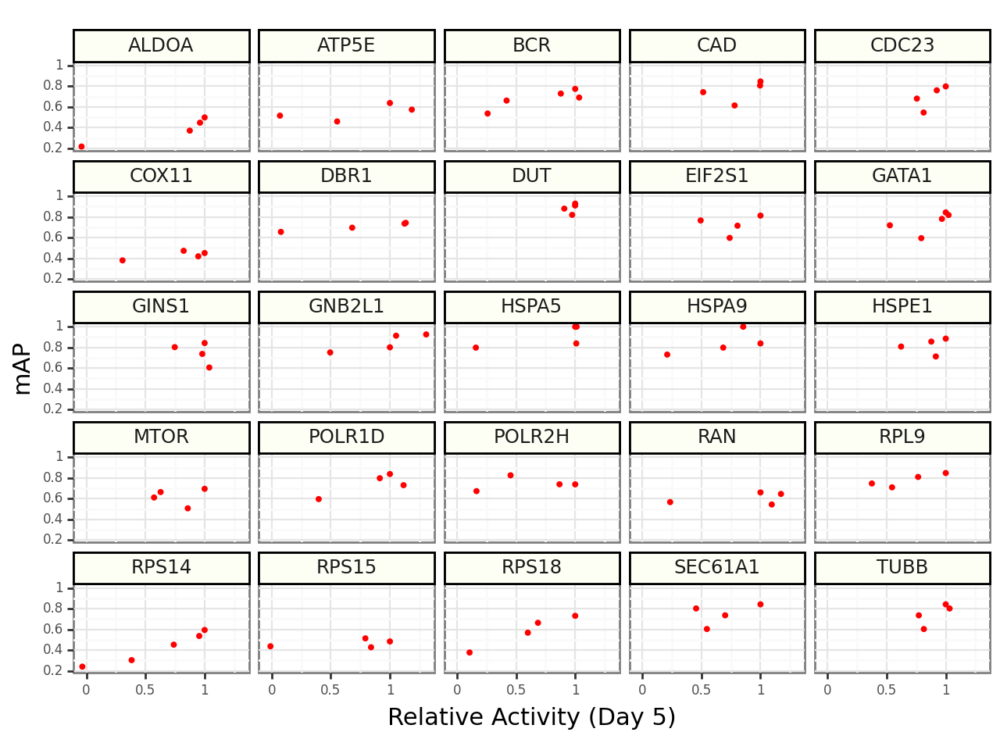

<Figure Size: (640 x 480)>

In [10]:
gene_gg = (
    gg.ggplot(bulk_grit_df, gg.aes(x="relative_activity_day5", y="mAP", color="'p < 0.05'"))
    + gg.geom_point(size=0.6)
    + gg.theme_bw()
    + gg.xlab("Relative Activity (Day 5)")
    + gg.ylab("mAP")
    + gg.scale_color_manual(values=["red", "blue"])
    # + gg.scale_color_gradient(low="blue", high="red", limits=[0, 1])  # Color gradient from blue to red
    + gg.guides(color=gg.guide_colorbar(title="mAP"))  # Add a colorbar for color scale
    # + gg.ggtitle(f"{gse_id} (Jost et al. 2020 CRISPRi)")
    + gg.facet_wrap("~gene")
    + gg.theme(
        strip_background=gg.element_rect(colour="black", fill="#fdfff4"),
        axis_text=gg.element_text(size=6),
    )
)

output_file = pathlib.Path(f"{output_dir}/{gse_id}_crispri_map_relative_activity_comparison.png")
gene_gg.save(output_file, dpi=500, height=5, width=6)

gene_gg

## Visualize single cell grit

In [7]:
# Load perturbseq gene expression data
perturbseq_data_dir = pathlib.Path("../../0.download-data/data/perturbseq/")

gene_exp_file = pathlib.Path(f"{perturbseq_data_dir}/{gse_id}_final_analytical.tsv.gz")

sc_gene_exp_df = pd.read_csv(gene_exp_file, sep="\t")

print(sc_gene_exp_df.shape)
sc_gene_exp_df.head()

/tmp/ipykernel_45814/2544316711.py:6: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.


(23537, 1012)


,Metadata_cell_identity,Metadata_cell_barcode,Metadata_guide_identity,Metadata_read_count,Metadata_UMI_count,Metadata_coverage,Metadata_gemgroup,Metadata_good_coverage,Metadata_number_of_cells,Metadata_gene_identity,...,YPEL4,YPEL5,ZBTB38,ZFAS1,ZFP36L1,ZNF365,ZNF43,ZNF483,ZNF556,ZYX
0,sc_profile_0,AAACCTGAGAGTAATC-1,RAN_RAN_+_131356438.23-P1P2_12,544.0,34.0,16.000000,1.0,True,1.0,RAN,...,-0.09309,-0.632468,-0.539091,-1.633805,-0.876912,-0.012155,-0.017763,-0.026877,-0.0524,-0.452229
1,sc_profile_1,AAACCTGAGGGATCTG-1,neg_ctrl_non-targeting_00089,267.0,19.0,14.052632,1.0,True,1.0,neg,...,-0.09309,-0.632468,-0.539091,1.610220,1.322265,-0.012155,-0.017763,-0.026877,-0.0524,-0.452229
2,sc_profile_2,AAACCTGAGGTCATCT-1,POLR2H_POLR2H_+_184081251.23-P1P2_08,622.0,34.0,18.294118,1.0,True,1.0,POLR2H,...,-0.09309,-0.632468,-0.539091,-0.567252,0.057540,-0.012155,-0.017763,-0.026877,-0.0524,-0.452229
3,sc_profile_3,AAACCTGCAATGGAGC-1,TUBB_TUBB_+_30688126.23-P1_03,433.0,20.0,21.650000,1.0,True,1.0,TUBB,...,-0.09309,1.765279,-0.539091,-1.659420,-0.876912,-0.012155,-0.017763,-0.026877,-0.0524,-0.452229
4,sc_profile_4,AAACCTGCACCAGGCT-1,CDC23_CDC23_-_137548987.23-P1P2_04,136.0,8.0,17.000000,1.0,True,1.0,CDC23,...,-0.09309,0.686753,-0.539091,0.541260,0.934539,-0.012155,-0.017763,-0.026877,-0.0524,1.406718


In [12]:
# Load single cell grit results
sc_results_file = pathlib.Path(f"{perturbseq_results_dir}/{gse_id}_single_cell_map.tsv.gz")
sc_df = pd.read_csv(sc_results_file, sep="\t")

# Load UMAP embeddings
sc_embeddings_file = pathlib.Path(f"{perturbseq_results_dir}/{gse_id}_single_cell_umap_embeddings.tsv.gz")
sc_embeddings_df = pd.read_csv(sc_embeddings_file, sep="\t")

In [9]:
sc_df["-log10(p-value)"] = -np.log10(sc_df["p_value"])
sc_df.rename(columns={"mean_ap": "mAP"}, inplace=True)
sc_df["p < 0.05"] = sc_df["p_value"] < 0.05
sc_df

,Metadata_guide_identity,Metadata_cell_identity,mAP,p_value,n_pos_pairs,n_total_pairs,grit_gene,grit_guide,-log10(p-value),p < 0.05
0,RAN_RAN_+_131356438.23-P1P2_12,sc_profile_0,0.299814,0.479781,201.0,688.0,RAN,RAN_RAN_+_131356438.23-P1P2_12,0.318957,False
1,RAN_RAN_+_131356438.23-P1P2_12,sc_profile_10030,0.297488,0.519024,201.0,688.0,RAN,RAN_RAN_+_131356438.23-P1P2_12,0.284813,False
2,RAN_RAN_+_131356438.23-P1P2_12,sc_profile_10094,0.297498,0.518983,201.0,688.0,RAN,RAN_RAN_+_131356438.23-P1P2_12,0.284847,False
3,RAN_RAN_+_131356438.23-P1P2_12,sc_profile_10164,0.297455,0.520104,201.0,688.0,RAN,RAN_RAN_+_131356438.23-P1P2_12,0.283910,False
4,RAN_RAN_+_131356438.23-P1P2_12,sc_profile_10280,0.297411,0.521261,201.0,688.0,RAN,RAN_RAN_+_131356438.23-P1P2_12,0.282945,False
...,...,...,...,...,...,...,...,...,...,...
20636,GNB2L1_GNB2L1_+_180670873.23-P1P2_00,sc_profile_7977,0.320324,0.012236,33.0,520.0,GNB2L1,GNB2L1_GNB2L1_+_180670873.23-P1P2_00,1.912374,True
20637,GNB2L1_GNB2L1_+_180670873.23-P1P2_00,sc_profile_8146,0.303507,0.012910,33.0,520.0,GNB2L1,GNB2L1_GNB2L1_+_180670873.23-P1P2_00,1.889080,True
20638,GNB2L1_GNB2L1_+_180670873.23-P1P2_00,sc_profile_9557,0.309466,0.013657,33.0,520.0,GNB2L1,GNB2L1_GNB2L1_+_180670873.23-P1P2_00,1.864630,True
20639,GNB2L1_GNB2L1_+_180670873.23-P1P2_00,sc_profile_9751,0.310072,0.014505,33.0,520.0,GNB2L1,GNB2L1_GNB2L1_+_180670873.23-P1P2_00,1.838488,True


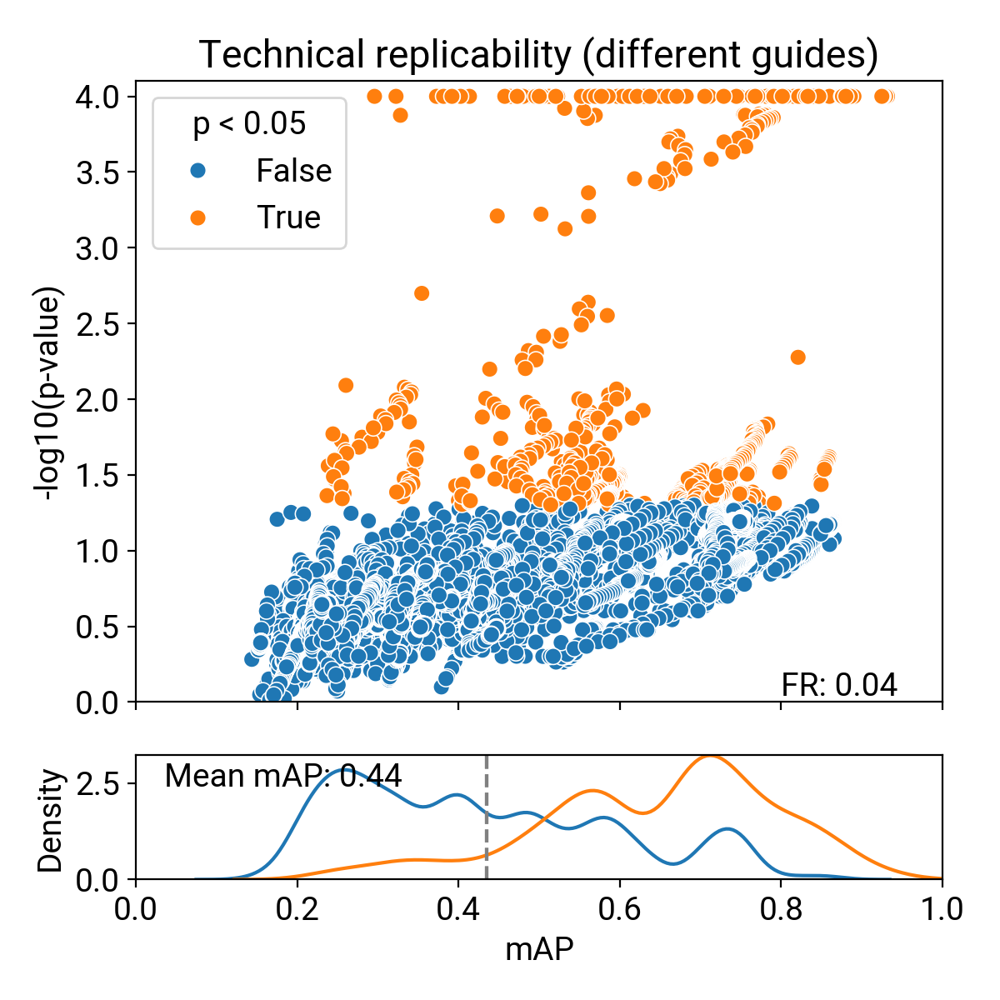

In [10]:
df = sc_df

def remove_inner_ticklabels(fig: plt.Figure):
    """
    Remove inner ticklabels from a figure.

    Parameters
    ----------
    fig : matplotlib.figure.Figure
        Figure to remove inner ticklabels from.
    """
    for ax in fig.axes:
        try:
            ax.label_outer()
        except AttributeError:
            pass


fig, axes = plt.subplots(2, 1, figsize=(6, 6), gridspec_kw={'height_ratios': [5, 1]})

mean_map = df['mAP'].mean()
fr = df['p < 0.05'].mean()
sns.scatterplot(
    ax=axes[0], 
    data=df, 
    x='mAP', 
    y='-log10(p-value)', 
    hue='p < 0.05',
    s=50
)
axes[0].set_title("Technical replicability (different guides)")
axes[0].text(0.8, 0.01, f"FR: {fr:.2f}", transform=axes[0].transAxes)

axes[0].set_xlabel("")
axes[0].set_ylim(0, max(df['-log10(p-value)'])+0.1)
sns.move_legend(axes[0], "upper left")

# Second Row: KDE plots
max_kde_y = 0
mean_map = df['mAP'].mean()
for p_value in df['p < 0.05'].unique():
    ax = sns.kdeplot(
        ax=axes[1],
        data=df[df['p < 0.05'] == p_value],
        x='mAP', 
        label=str(p_value)
    )
    max_kde_y = max(max_kde_y, max(ax.lines[-1].get_ydata()))
    axes[1].axvline(mean_map, color='grey', linestyle='--')
# axes[1].set_ylabel("")
axes[1].set_ylim(0, max_kde_y)
axes[1].text(mean_map-0.4, 0.75, f"Mean mAP: {mean_map:.2f}", transform=axes[1].transAxes)

for ax in axes.flat:
    ax.set_xlim(0, 1)  # Set x-axis limit to 0-1 for all subplots

remove_inner_ticklabels(fig)
plt.tight_layout()
plt.show()


In [11]:
sc_df = sc_embeddings_df.merge(
    sc_df,
    left_on=["Metadata_cell_identity", "Metadata_guide_identity", "grit_gene"],
    right_on=["Metadata_cell_identity", "Metadata_guide_identity", "grit_gene"],
    how="right",
)

sc_df = sc_df.merge(
    bulk_grit_df,
    left_on=["Metadata_guide_identity", "Metadata_gene_identity"],
    right_on=["perturbation", "Metadata_gene_identity"],
    how="outer",
    suffixes=["", "_bulk_activity"],
)


sc_df.loc[:, "gene"] = pd.Categorical(sc_df.gene, categories=bulk_grit_df.gene.unique())

sc_df.loc[:, "Metadata_gene_identity"] = pd.Categorical(
    sc_df.Metadata_gene_identity,
    categories=["neg"] + bulk_grit_df.gene.unique().tolist(),
)

print(sc_df.shape)
sc_df.head()

(20641, 36)


,Metadata_cell_identity,Metadata_cell_barcode,Metadata_guide_identity,Metadata_read_count,Metadata_UMI_count,Metadata_coverage,Metadata_gemgroup,Metadata_good_coverage,Metadata_number_of_cells,Metadata_gene_identity,...,n_total_pairs_bulk_activity,id,sequence,gene,gamma_day5,gamma_day10,relative_activity_day5,relative_activity_day10,-log10(p-value)_bulk_activity,p < 0.05_bulk_activity
0,sc_profile_0,AAACCTGAGAGTAATC-1,RAN_RAN_+_131356438.23-P1P2_12,544.0,34.0,16.000000,1.0,True,1.0,RAN,...,14.0,RAN_+_131356438.23-P1P2_12,GGCGGTCGCTGCGCTTAGGT,RAN,-0.046549,-0.034259,0.235823,0.212155,0.544559,False
1,sc_profile_10030,ATTCTACCATGCAACT-2,RAN_RAN_+_131356438.23-P1P2_12,643.0,22.0,29.227273,2.0,True,1.0,RAN,...,14.0,RAN_+_131356438.23-P1P2_12,GGCGGTCGCTGCGCTTAGGT,RAN,-0.046549,-0.034259,0.235823,0.212155,0.544559,False
2,sc_profile_10094,ATTTCTGCAGGTCGTC-2,RAN_RAN_+_131356438.23-P1P2_12,694.0,37.0,18.756757,2.0,True,1.0,RAN,...,14.0,RAN_+_131356438.23-P1P2_12,GGCGGTCGCTGCGCTTAGGT,RAN,-0.046549,-0.034259,0.235823,0.212155,0.544559,False
3,sc_profile_10164,CAAGATCAGGTTACCT-2,RAN_RAN_+_131356438.23-P1P2_12,317.0,12.0,26.416667,2.0,True,2.0,RAN,...,14.0,RAN_+_131356438.23-P1P2_12,GGCGGTCGCTGCGCTTAGGT,RAN,-0.046549,-0.034259,0.235823,0.212155,0.544559,False
4,sc_profile_10280,CACAGGCCAAGGTGTG-2,RAN_RAN_+_131356438.23-P1P2_12,818.0,29.0,28.206897,2.0,True,1.0,RAN,...,14.0,RAN_+_131356438.23-P1P2_12,GGCGGTCGCTGCGCTTAGGT,RAN,-0.046549,-0.034259,0.235823,0.212155,0.544559,False


/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/GSE132080_singlecell_crispri_map_relative_activity_comparison.png


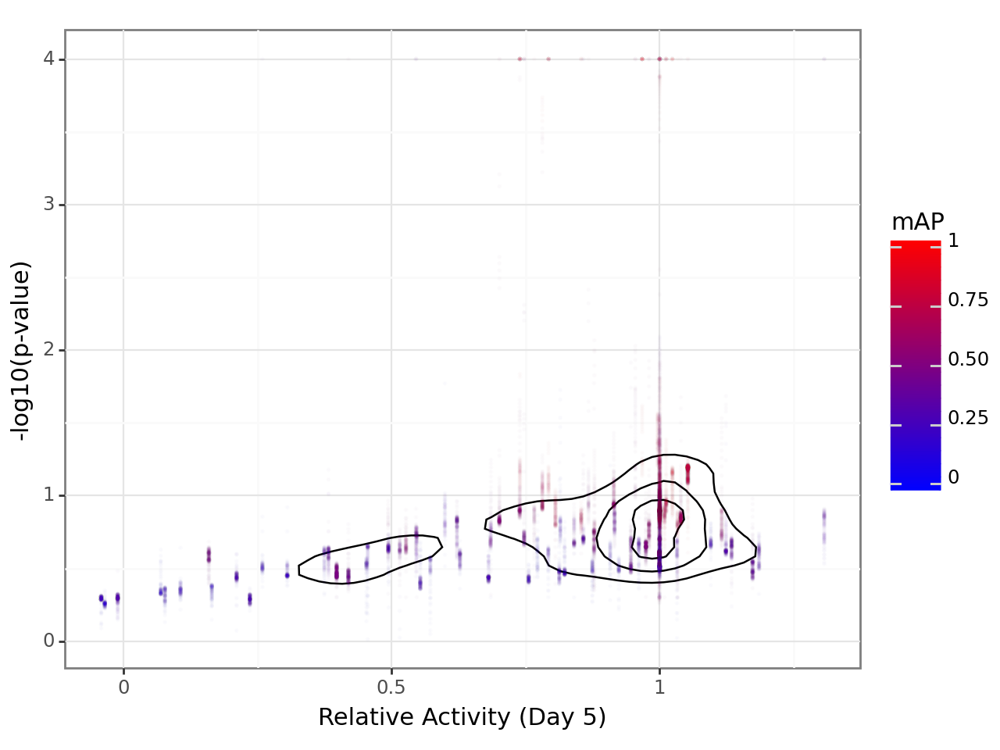

<Figure Size: (640 x 480)>

In [12]:
global_gg = (
    gg.ggplot(sc_df.dropna(subset=["gene"]), gg.aes(x="relative_activity_day5", y="-log10(p-value)", color="mAP"))
    + gg.geom_density_2d()
    + gg.geom_point(size=0.2, alpha=0.01)
    + gg.theme_bw()
    + gg.xlab("Relative Activity (Day 5)")
    + gg.ylab("-log10(p-value)")
    + gg.scale_color_gradient(low="blue", high="red", limits=[0, 1])  # Color gradient from blue to red
)

output_file = pathlib.Path(f"{output_dir}/{gse_id}_singlecell_crispri_map_relative_activity_comparison.png")
global_gg.save(output_file, dpi=500, height=5, width=6)

global_gg

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/GSE132080_singlecell_by_gene_crispri_map_relative_activity_comparison.png


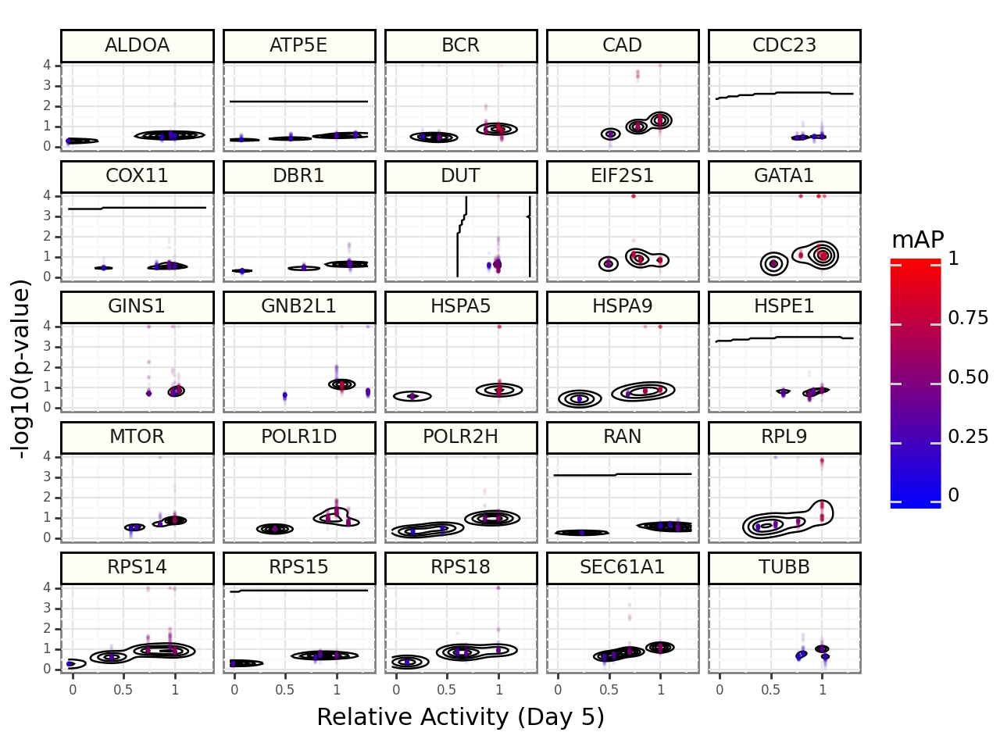

<Figure Size: (640 x 480)>

In [13]:
gene_gg = (
    gg.ggplot(sc_df.dropna(subset=["gene"]), gg.aes(x="relative_activity_day5", y="-log10(p-value)", color="mAP"))
    + gg.geom_density_2d()
    + gg.geom_point(alpha=0.05, size=0.1)
    + gg.theme_bw()
    + gg.xlab("Relative Activity (Day 5)")
    + gg.ylab("-log10(p-value)")
    + gg.scale_color_gradient(low="blue", high="red", limits=[0, 1]) 
    + gg.guides(color=gg.guide_colorbar(title="mAP"))
    + gg.facet_wrap("~gene")
    + gg.theme(
        strip_background=gg.element_rect(colour="black", fill="#fdfff4"),
        axis_text=gg.element_text(size=6),
    )
)

output_file = pathlib.Path(f"{output_dir}/{gse_id}_singlecell_by_gene_crispri_map_relative_activity_comparison.png")
gene_gg.save(output_file, dpi=500, height=5, width=6)

gene_gg

## Plot individual UMAPs per gene

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_RAN_singlecell_umap_map.png


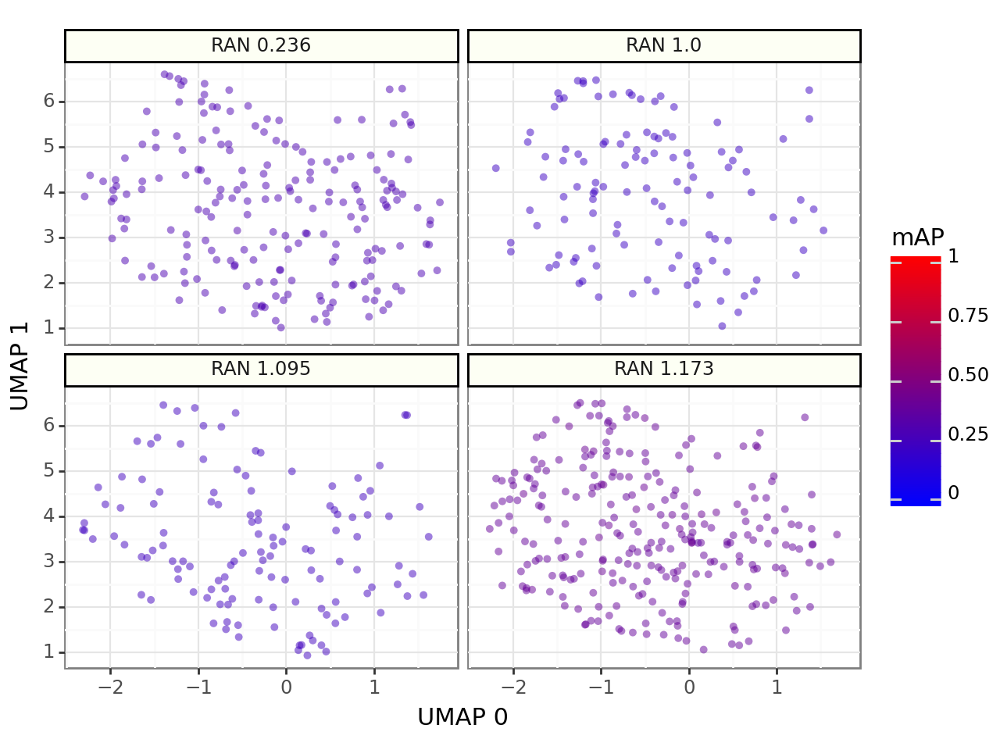

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_POLR2H_singlecell_umap_map.png


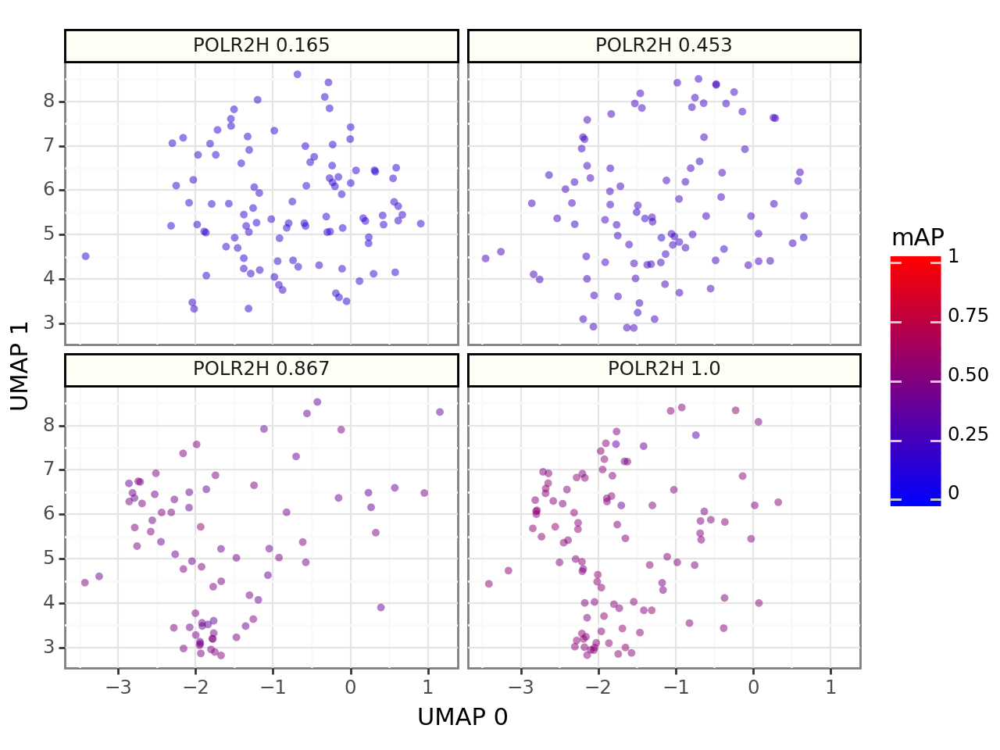

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_TUBB_singlecell_umap_map.png


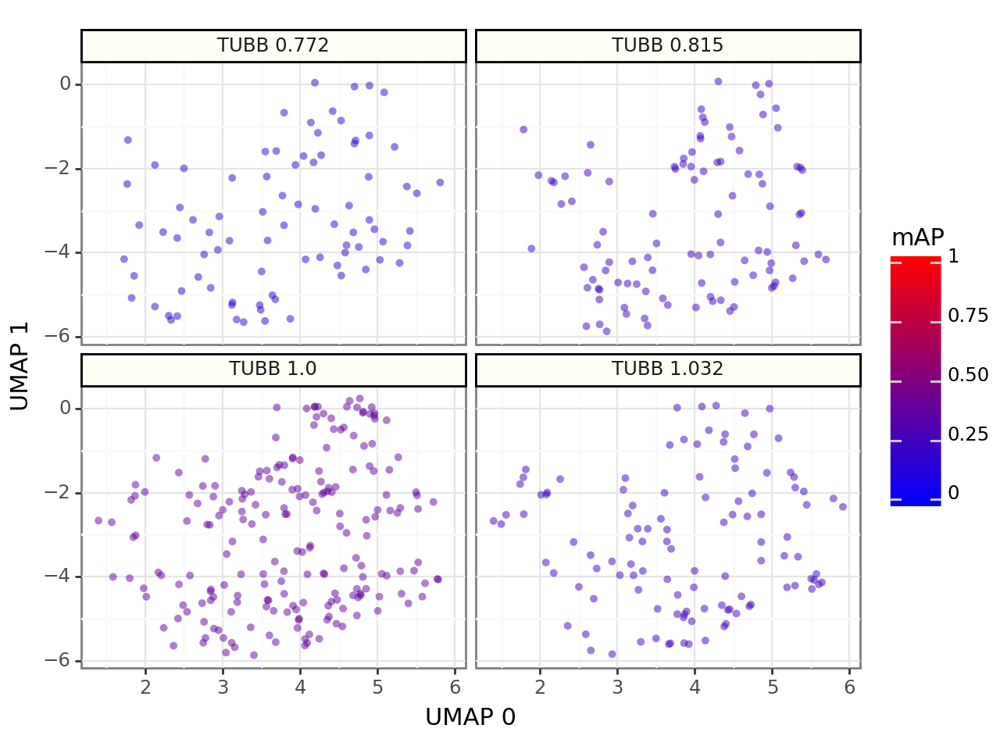

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_TUBB_singlecell_umap_expression.png


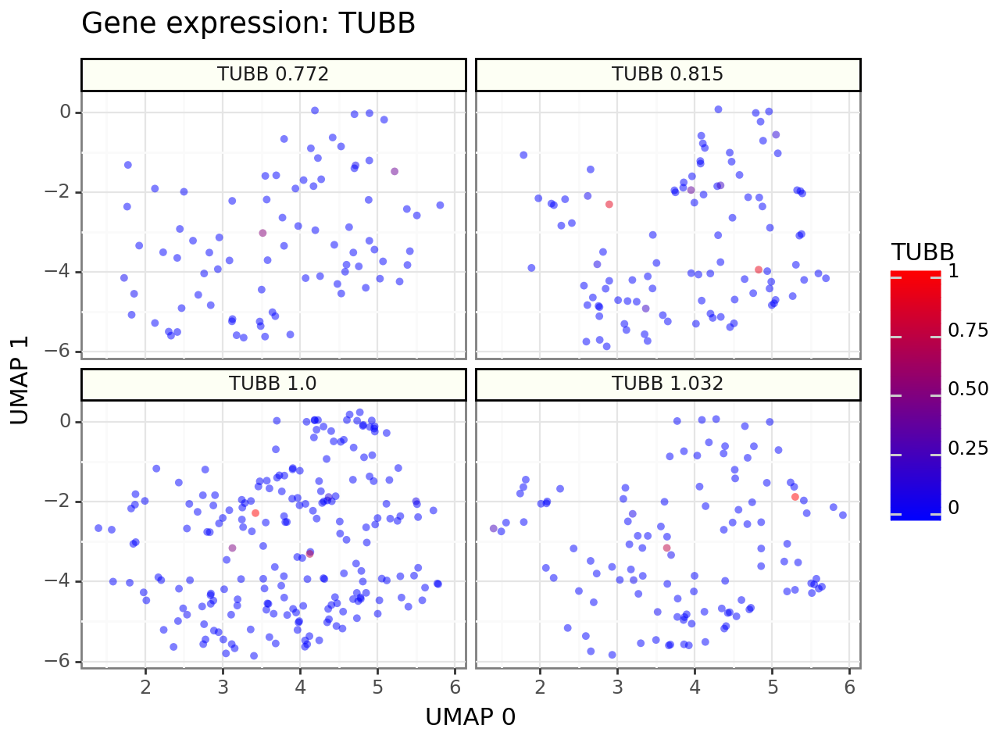

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_CDC23_singlecell_umap_map.png


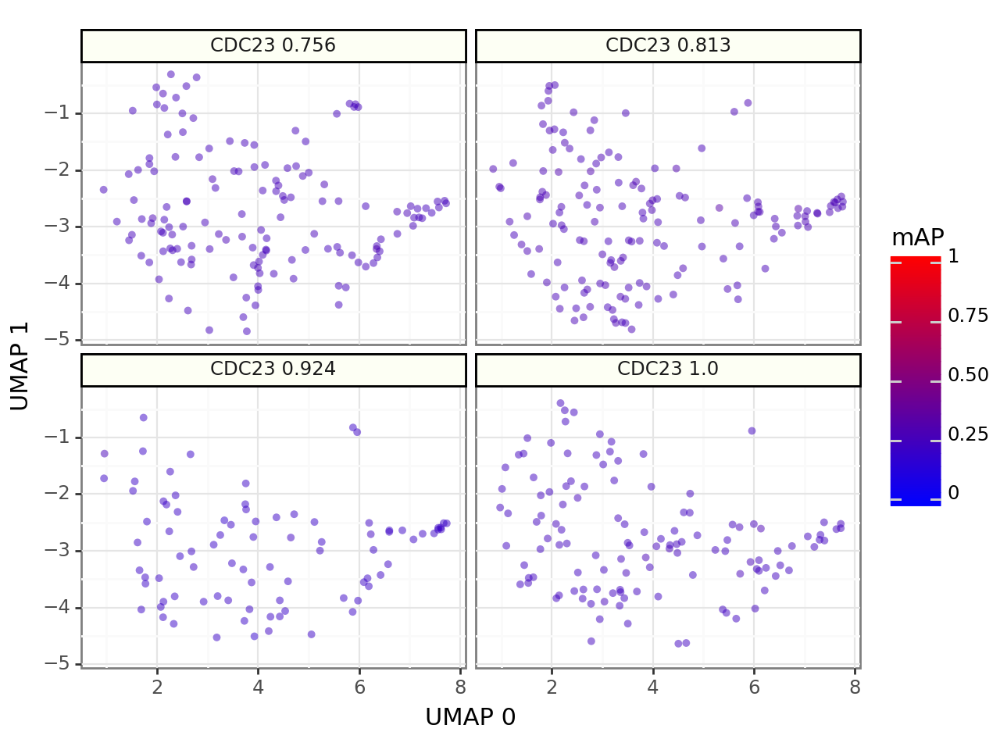

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_POLR1D_singlecell_umap_map.png


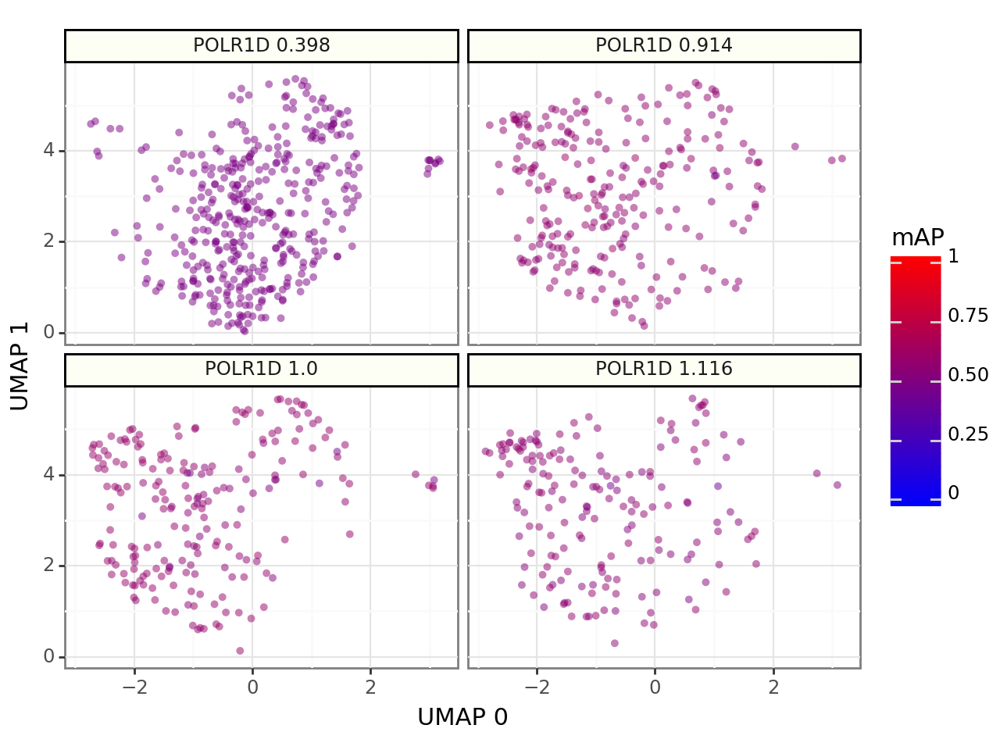

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_DUT_singlecell_umap_map.png


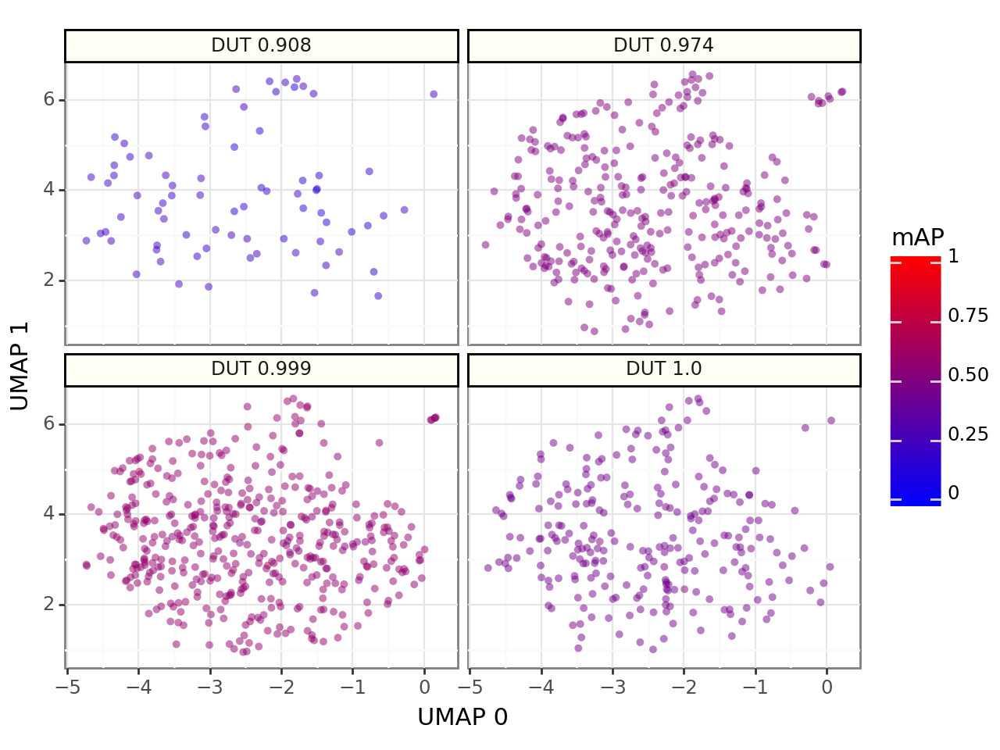

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_DUT_singlecell_umap_expression.png


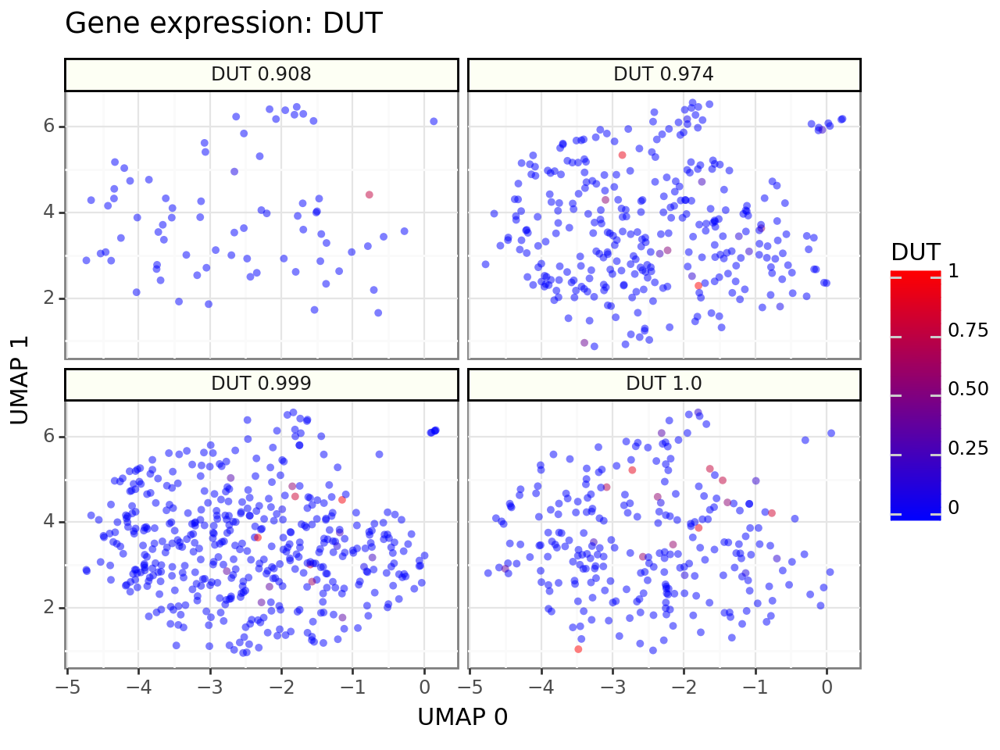

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_HSPA5_singlecell_umap_map.png


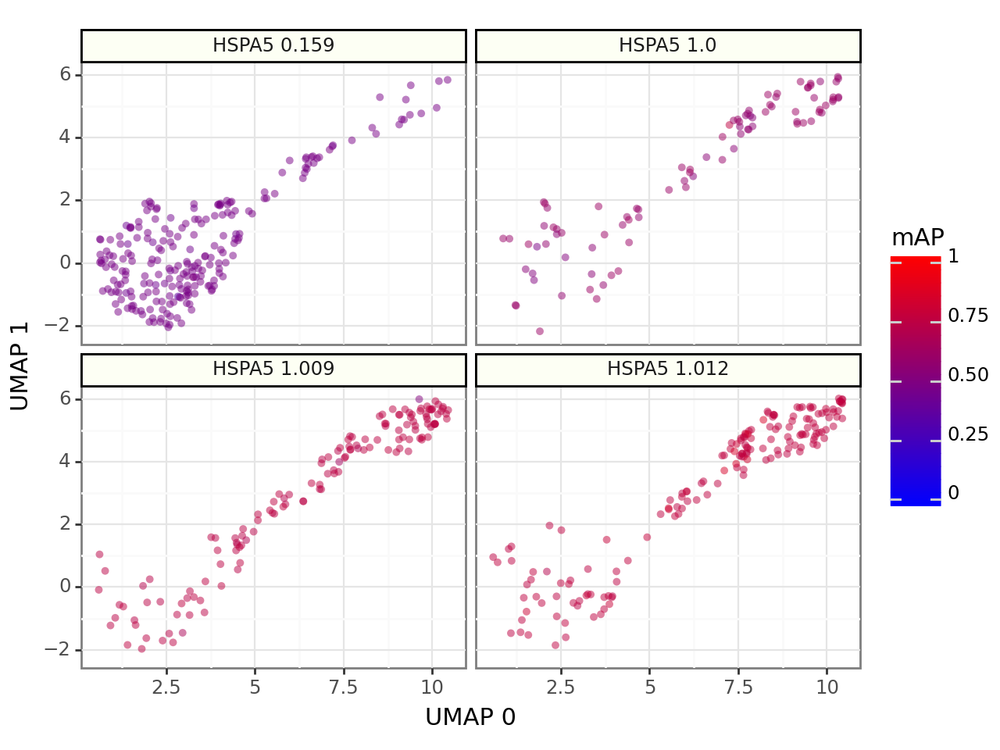

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_HSPA5_singlecell_umap_expression.png


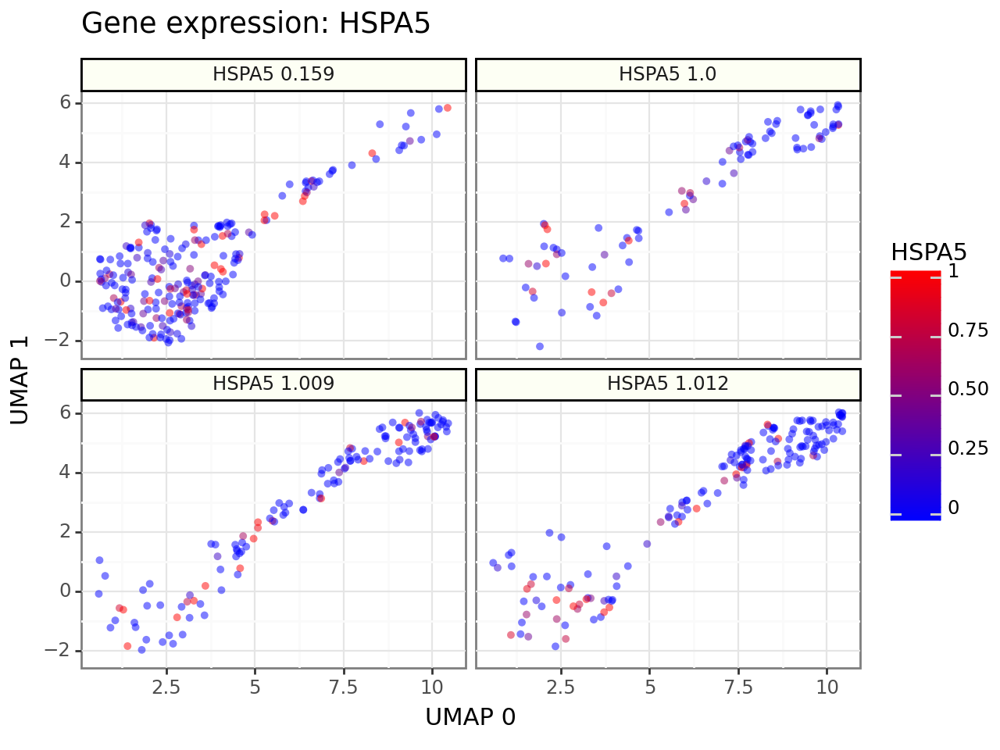

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_MTOR_singlecell_umap_map.png


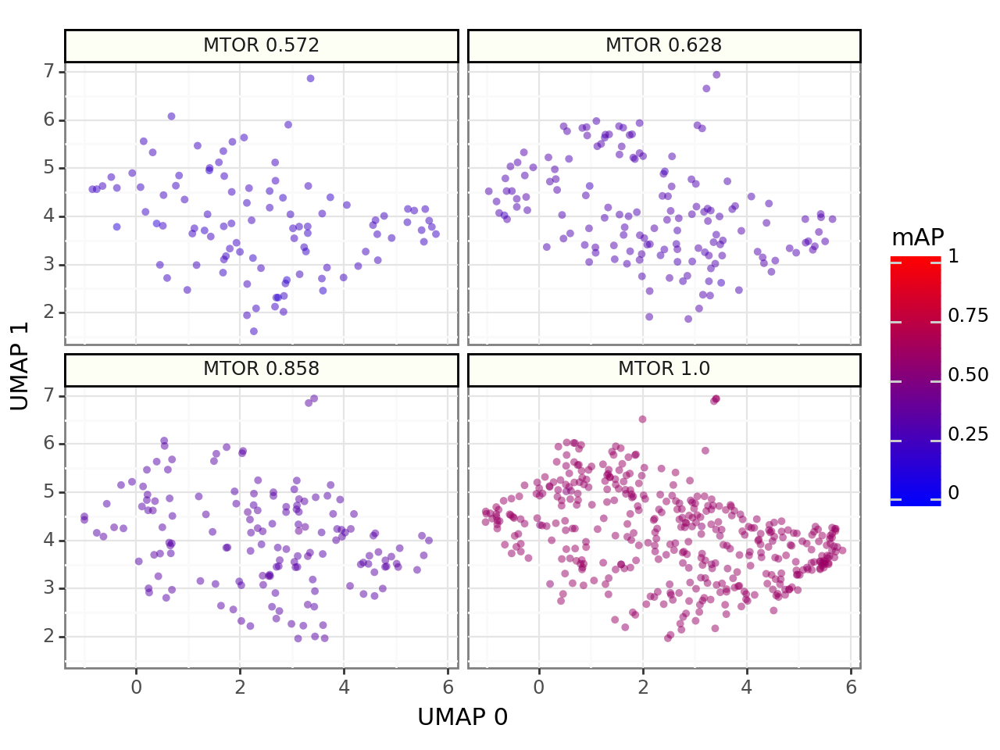

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_GATA1_singlecell_umap_map.png


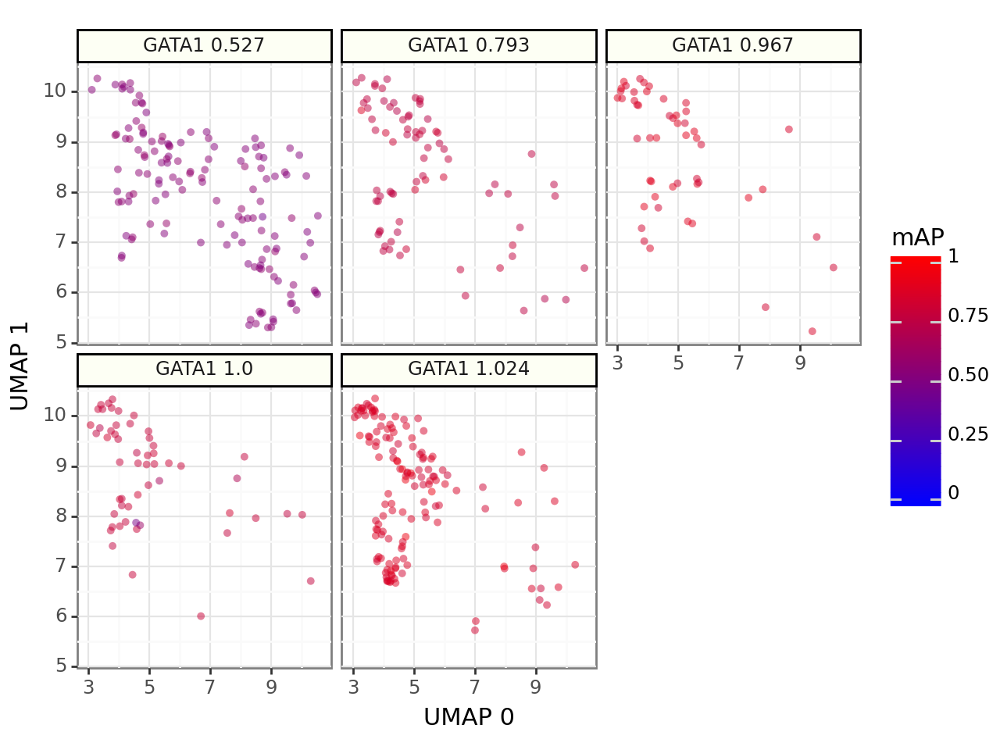

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_GINS1_singlecell_umap_map.png


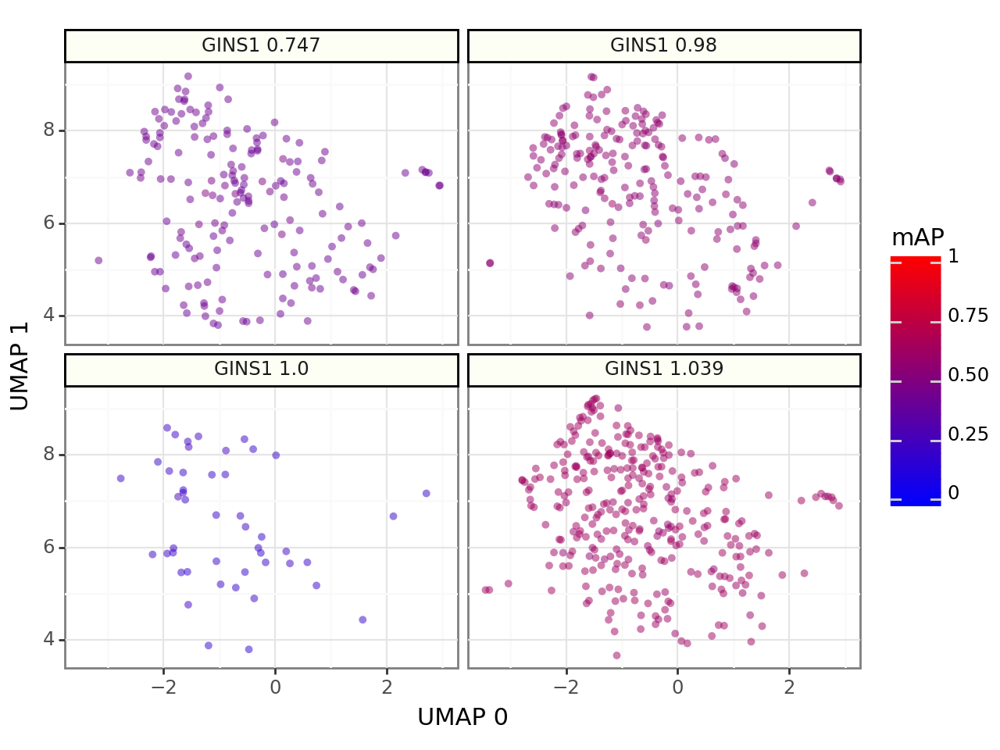

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_HSPE1_singlecell_umap_map.png


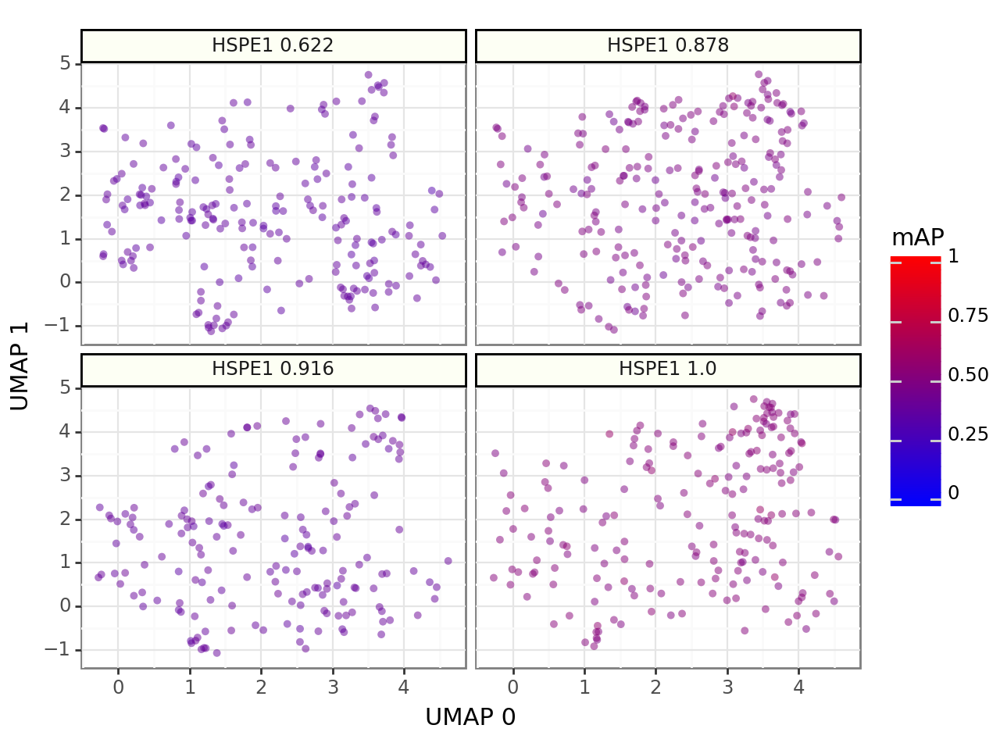

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_HSPE1_singlecell_umap_expression.png


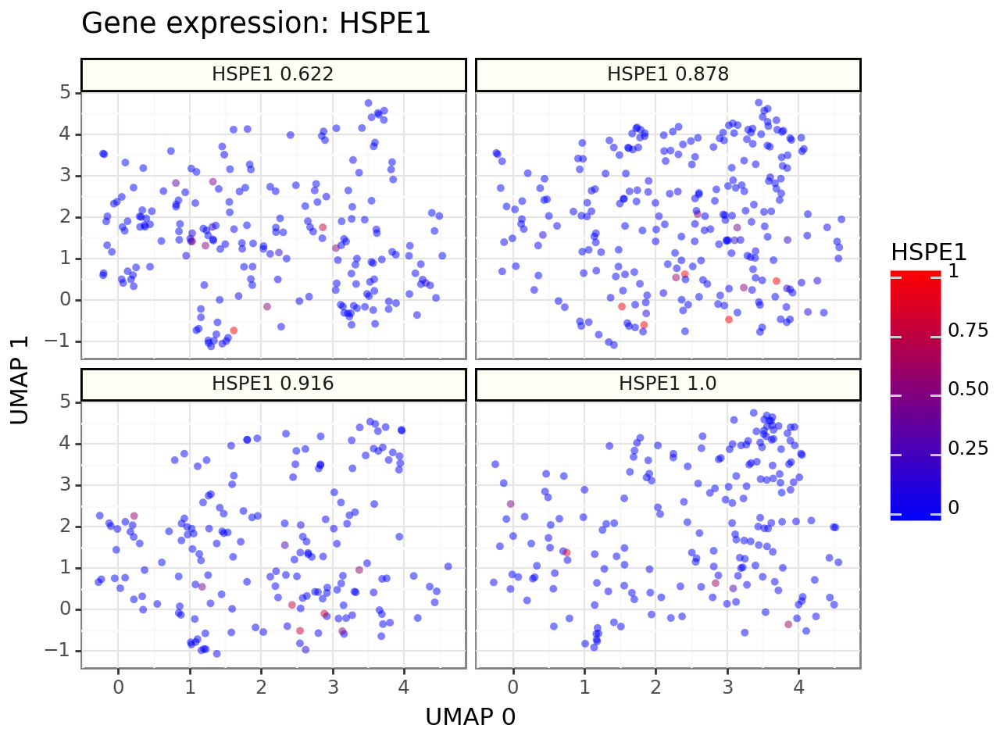

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_RPS14_singlecell_umap_map.png


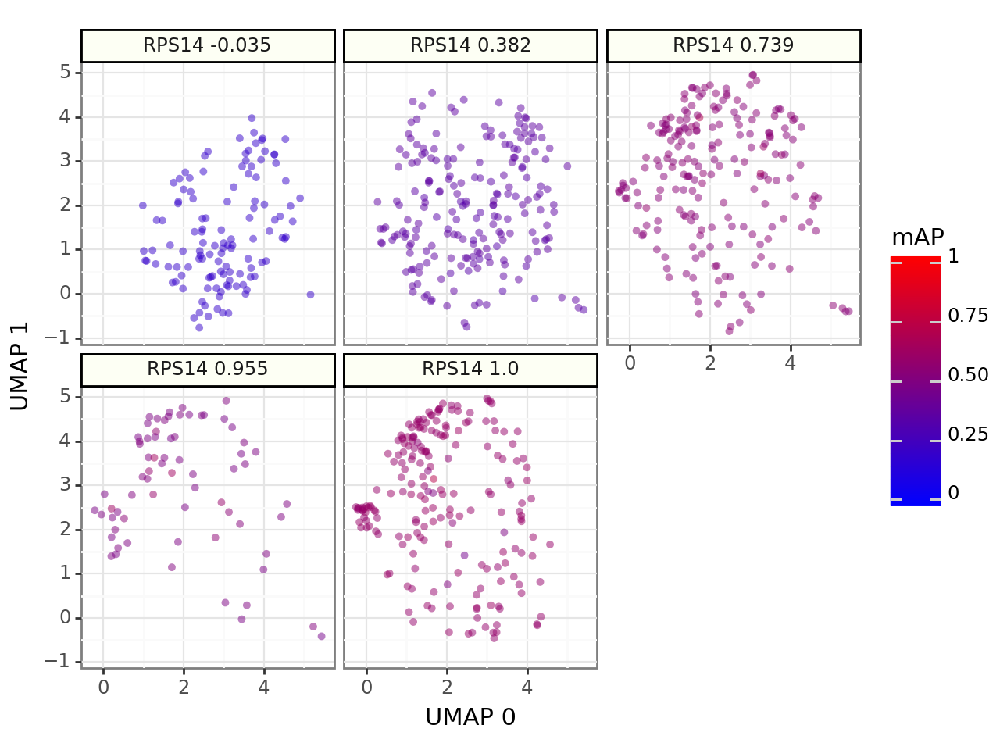

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_EIF2S1_singlecell_umap_map.png


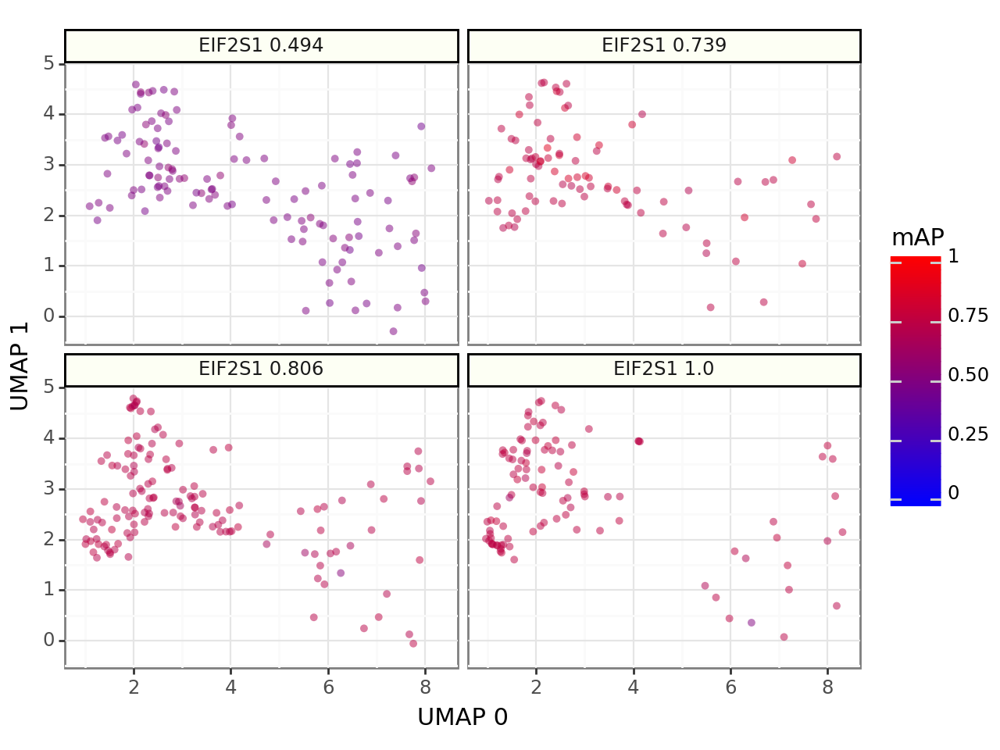

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_DBR1_singlecell_umap_map.png


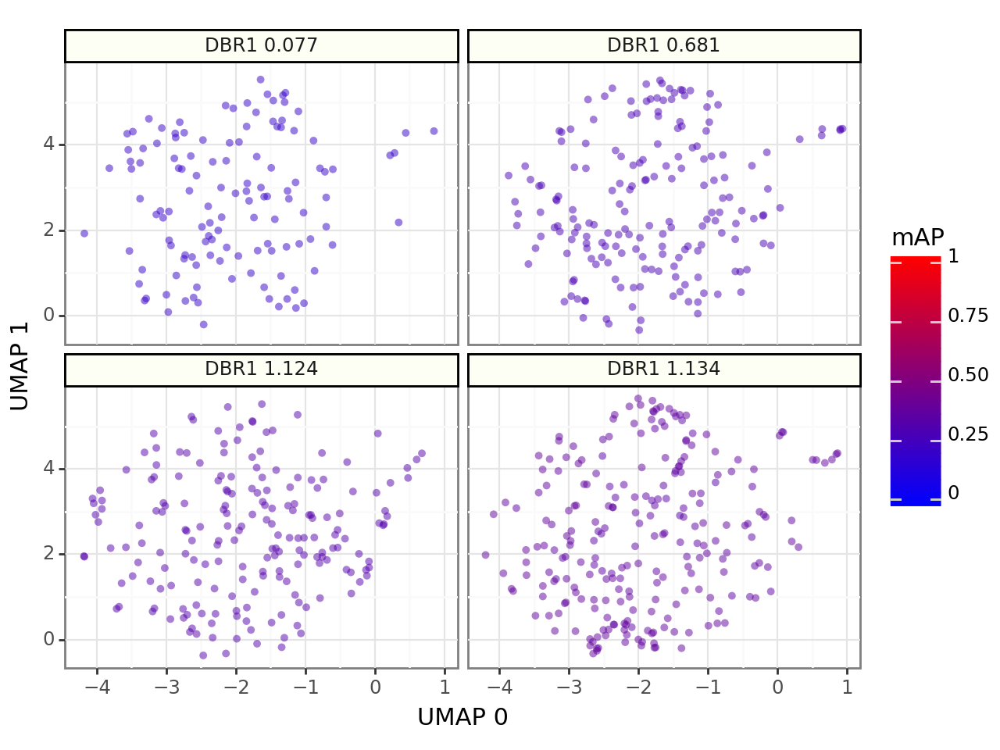

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_CAD_singlecell_umap_map.png


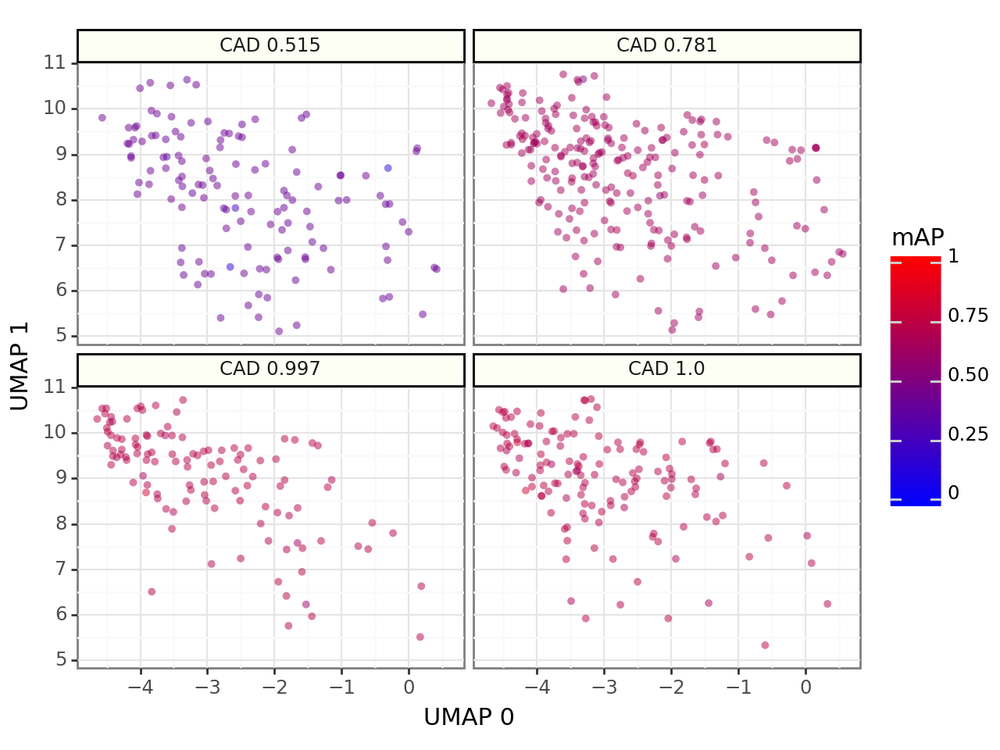

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_SEC61A1_singlecell_umap_map.png


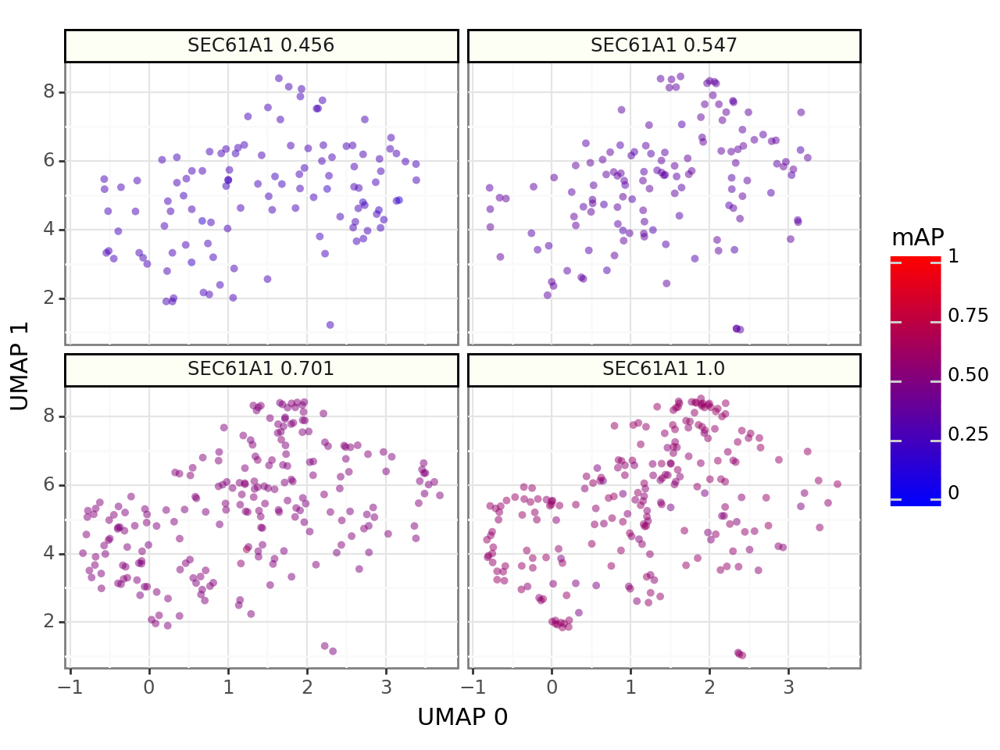

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_RPL9_singlecell_umap_map.png


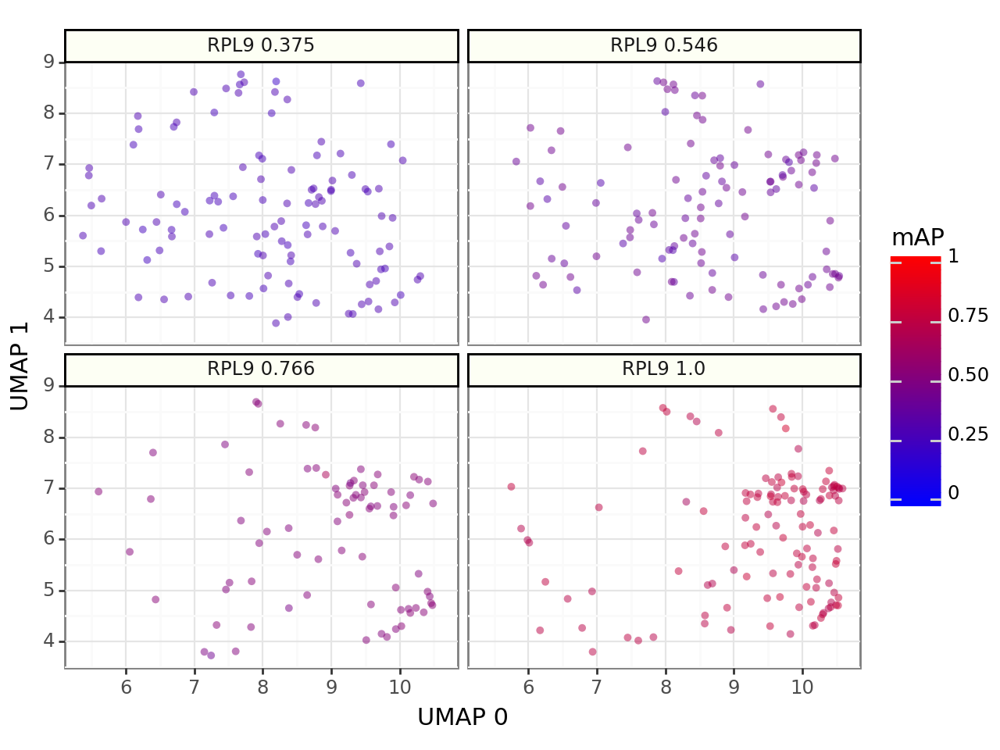

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_HSPA9_singlecell_umap_map.png


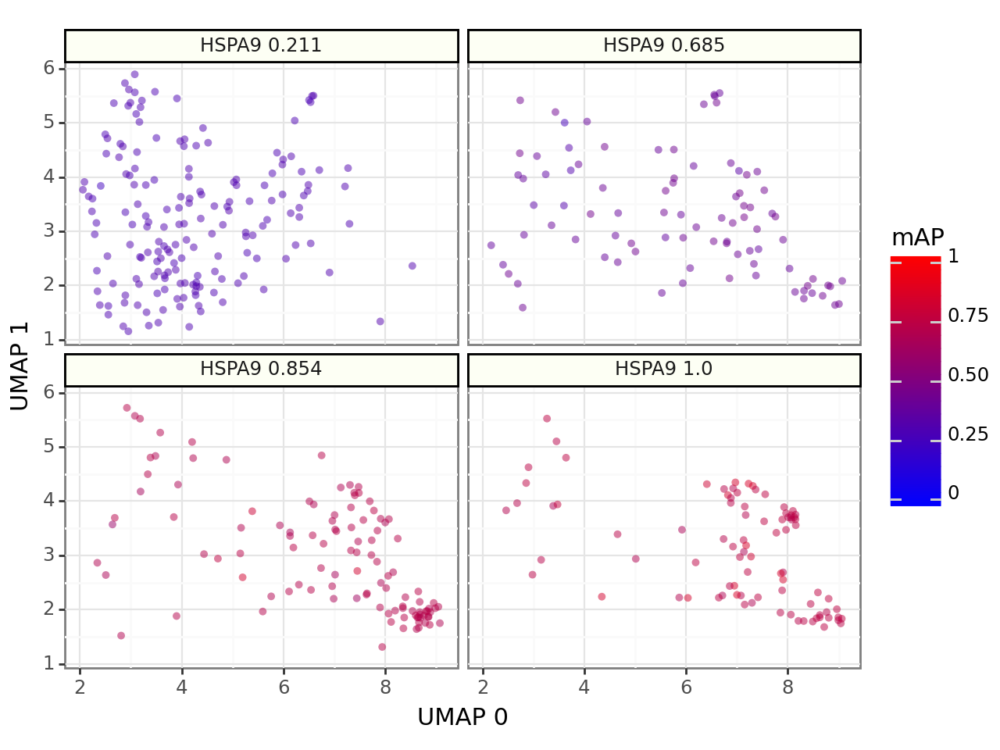

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_RPS18_singlecell_umap_map.png


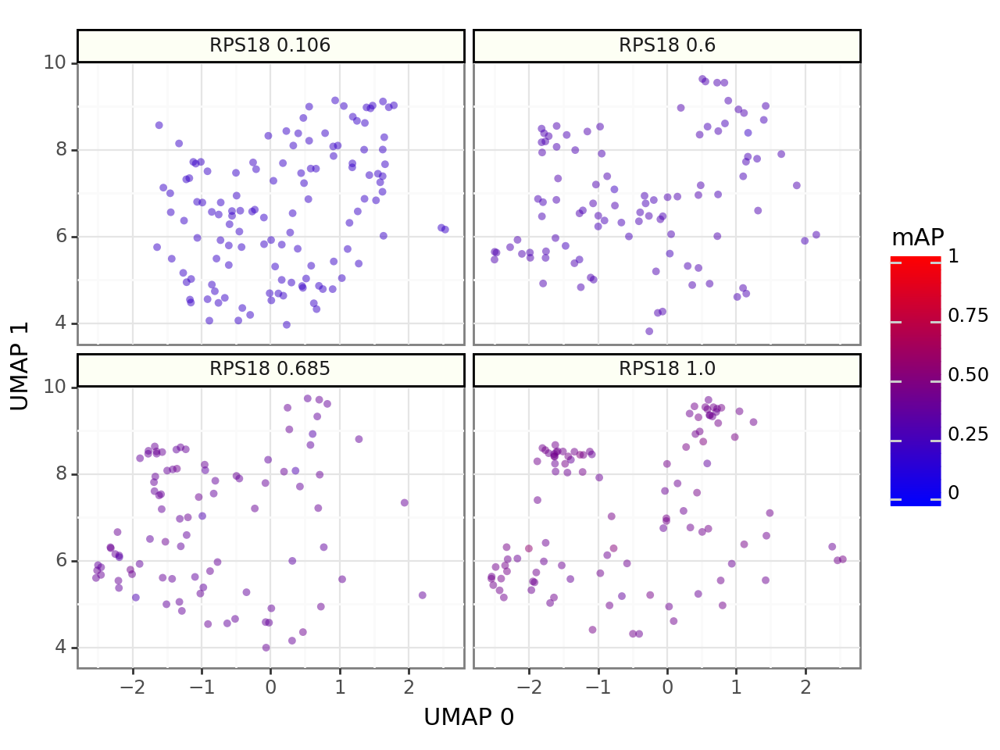

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_ALDOA_singlecell_umap_map.png


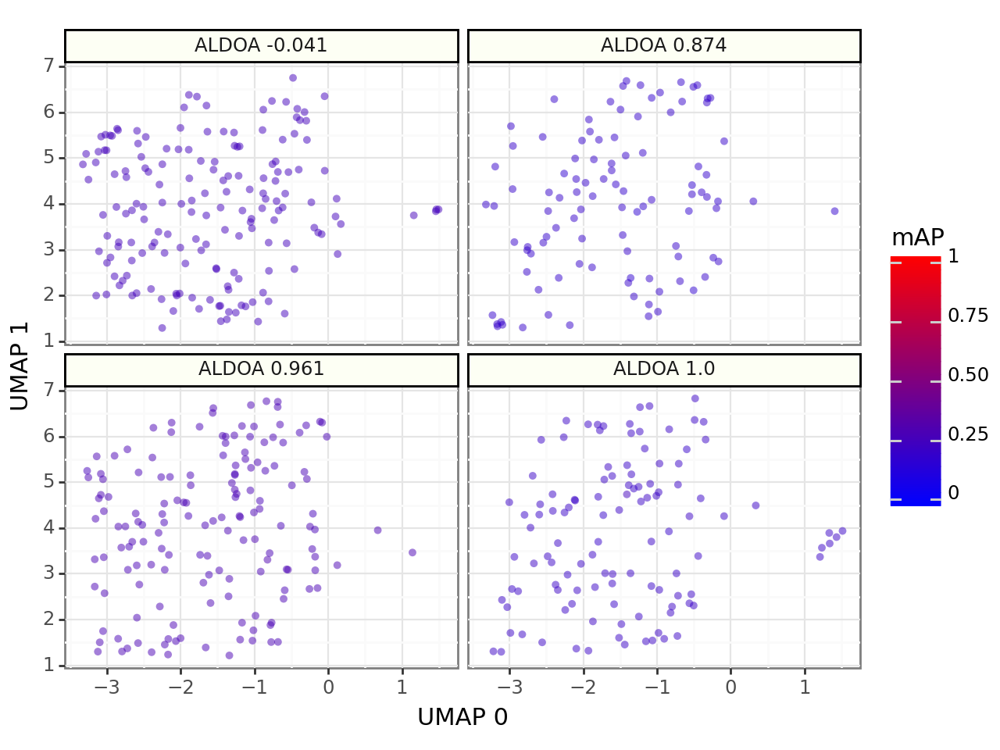

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_RPS15_singlecell_umap_map.png


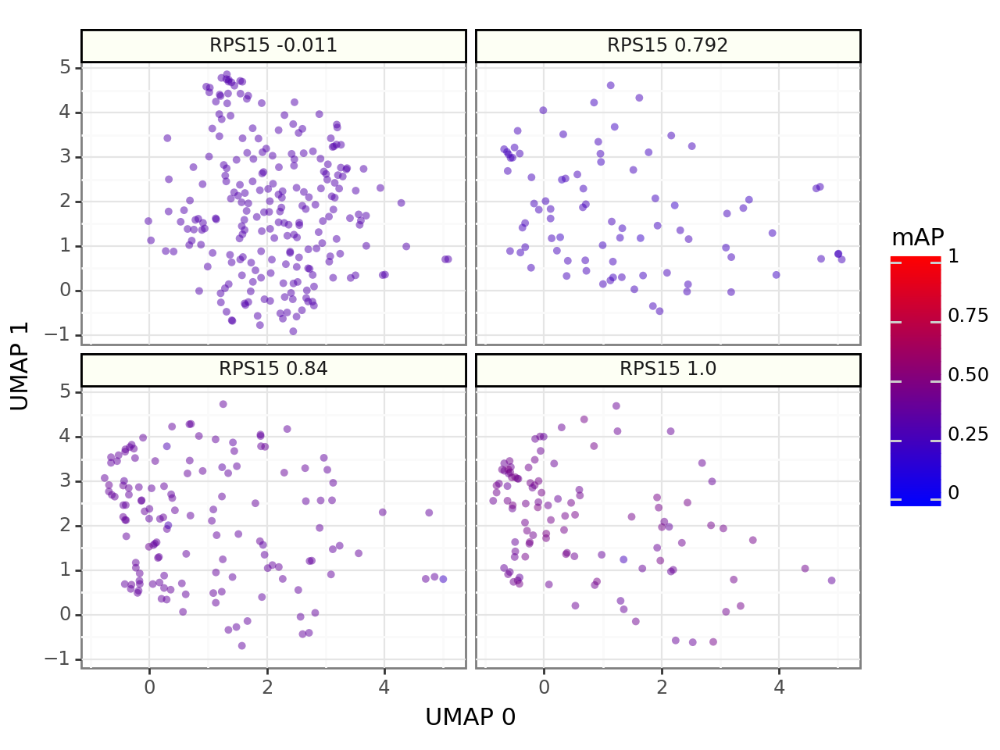

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_ATP5E_singlecell_umap_map.png


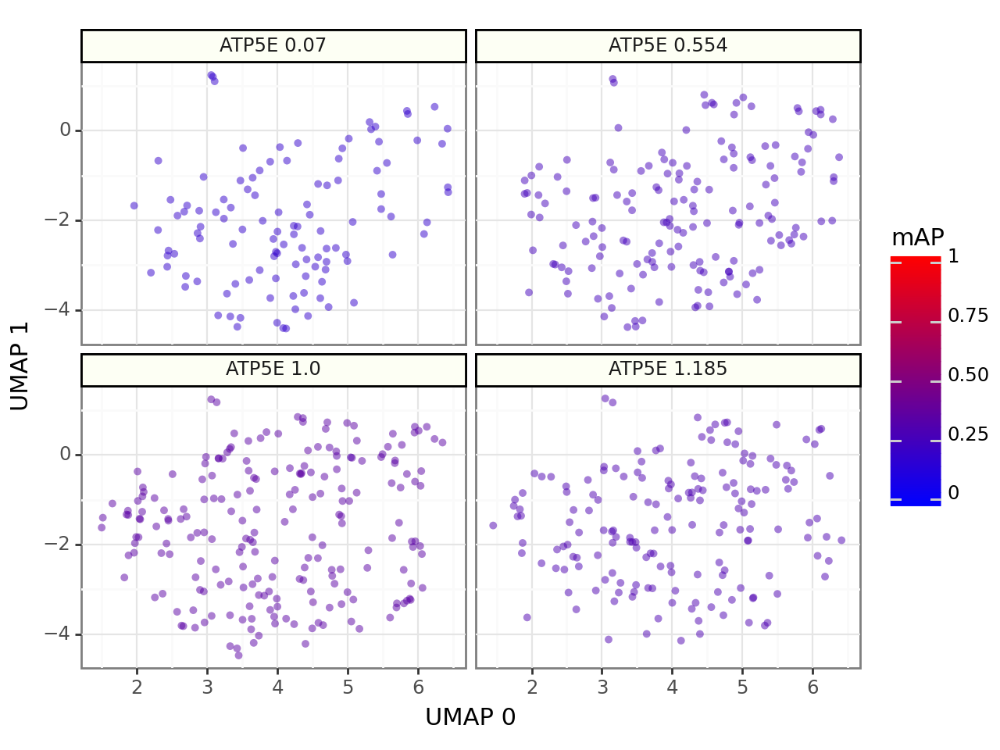

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_COX11_singlecell_umap_map.png


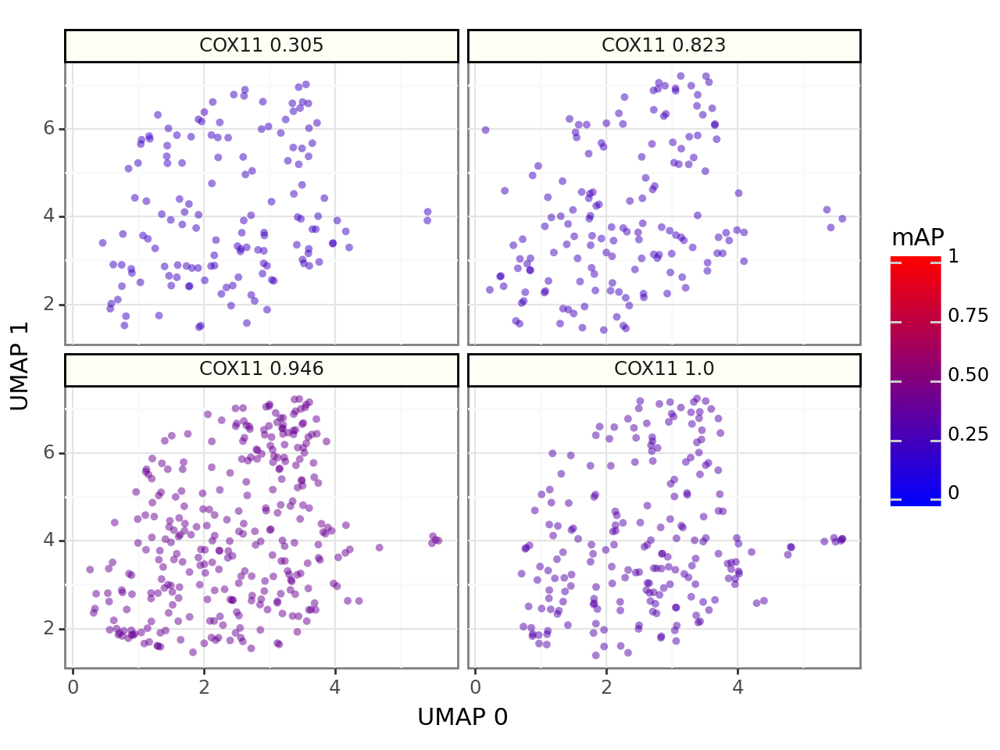

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_BCR_singlecell_umap_map.png


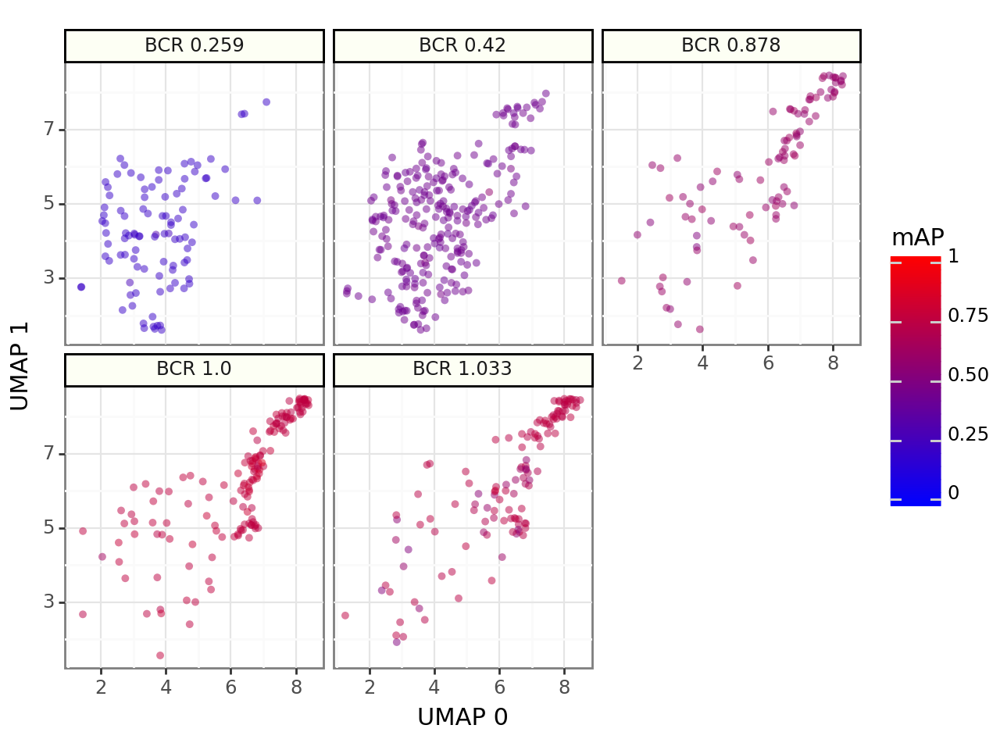

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_GNB2L1_singlecell_umap_map.png


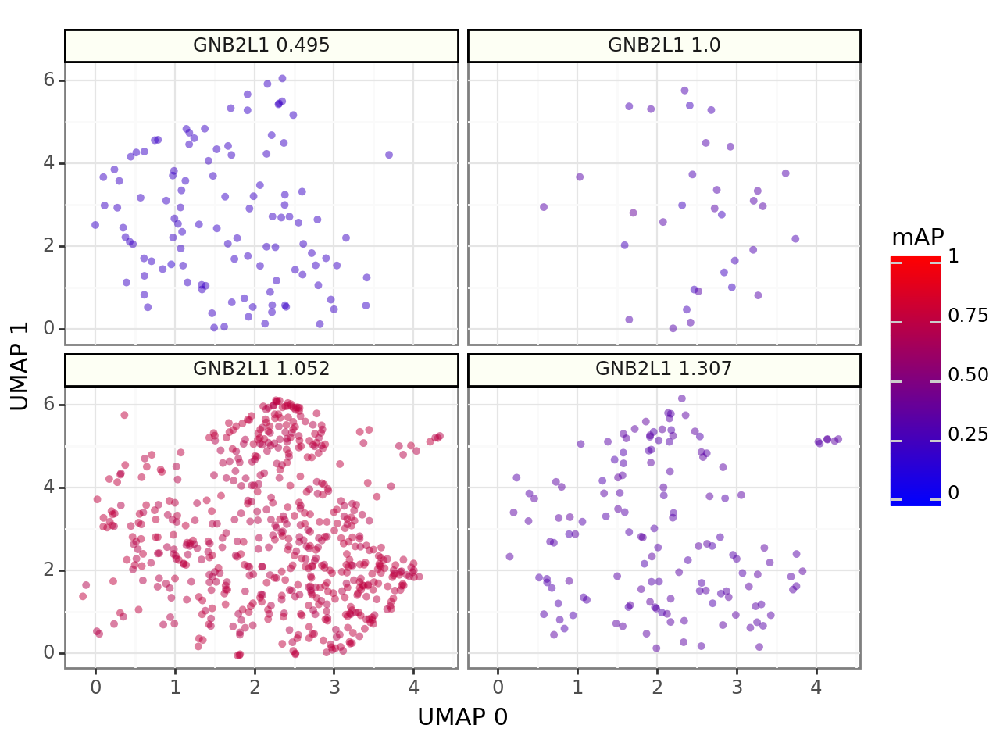

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_GNB2L1_singlecell_umap_expression.png


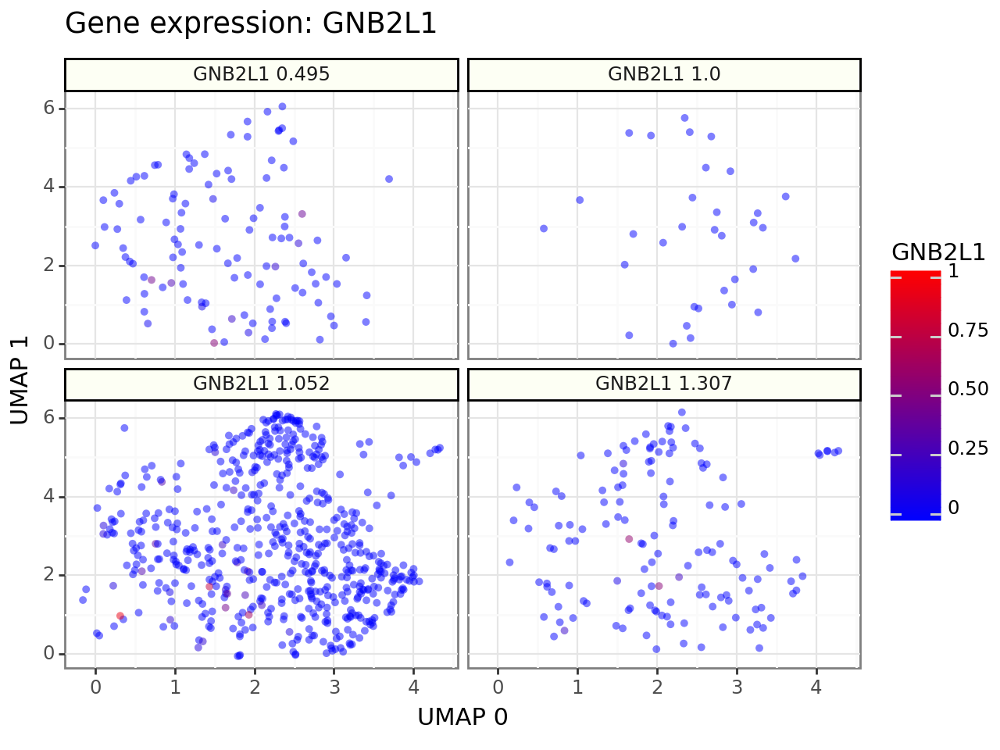

In [14]:
for gene in sc_df.gene.unique():
    if gene in ["neg", "*", "nan", np.nan]:
        continue

    gene_embedding_df = sc_df.query("grit_gene == @gene")

    gene_embedding_df = gene_embedding_df.assign(
        grit_facet_label=(
            gene_embedding_df.grit_gene + " " + gene_embedding_df.relative_activity_day5.round(3).astype(str)
        )
    )

    # Setup data frame for plotting
    gene_embedding_df.loc[gene_embedding_df.Metadata_gene_identity == "neg", "grit_facet_label"] = "Negative Ctrl"
    facet_order = ["Negative Ctrl"] + [
        f"{gene_embedding_df.grit_gene.unique()[0]} " + str(x)
        for x in sorted(gene_embedding_df.relative_activity_day5.dropna().unique().round(3))
    ]
    gene_embedding_df.loc[:, "grit_facet_label"] = pd.Categorical(
        gene_embedding_df.grit_facet_label, categories=facet_order
    )

    gene_gg = (
        gg.ggplot(
            gene_embedding_df.dropna(subset=["grit_facet_label"]),
            gg.aes(x="umap_0", y="umap_1"),
        )
        + gg.geom_point(gg.aes(color="mAP"), size=2, stroke=0, alpha=0.5)
        + gg.facet_wrap("~grit_facet_label")
        + gg.theme_bw()
        + gg.xlab("UMAP 0")
        + gg.ylab("UMAP 1")
        + gg.theme(strip_background=gg.element_rect(colour="black", fill="#fdfff4"))
        + gg.scale_color_gradient(low="blue", high="red", limits=[0, 1])
    )

    output_file = pathlib.Path(f"{output_dir}/gene_umaps/{gse_id}_{gene}_singlecell_umap_map.png")
    gene_gg.save(output_file, dpi=500, height=5, width=6)
    print(gene_gg)

    # Some genes were also directly measured. How does the expression of these look in UMAP space?
    if gene in sc_gene_exp_df.columns:
        meta_merge_cols = [x for x in sc_gene_exp_df.columns if x.startswith("Metadata_")]
        sc_geneexp_embed_df = gene_embedding_df.merge(sc_gene_exp_df, on=meta_merge_cols, how="left")

        geneexp_gg = (
            gg.ggplot(
                sc_geneexp_embed_df.dropna(subset=["grit_facet_label"]),
                gg.aes(x="umap_0", y="umap_1"),
            )
            + gg.geom_point(gg.aes(color=gene), size=2, stroke=0, alpha=0.5)
            + gg.ggtitle(f"Gene expression: {gene}")
            + gg.facet_wrap("~grit_facet_label")
            + gg.theme_bw()
            + gg.xlab("UMAP 0")
            + gg.ylab("UMAP 1")
            + gg.theme(strip_background=gg.element_rect(colour="black", fill="#fdfff4"))
            + gg.scale_color_gradient(low="blue", high="red", limits=[0, 1])
        )

        output_file = pathlib.Path(f"{output_dir}/gene_umaps/{gse_id}_{gene}_singlecell_umap_expression.png")
        geneexp_gg.save(output_file, dpi=500, height=5, width=6)
        print(geneexp_gg)

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_RAN_singlecell_umap_map_pval.png


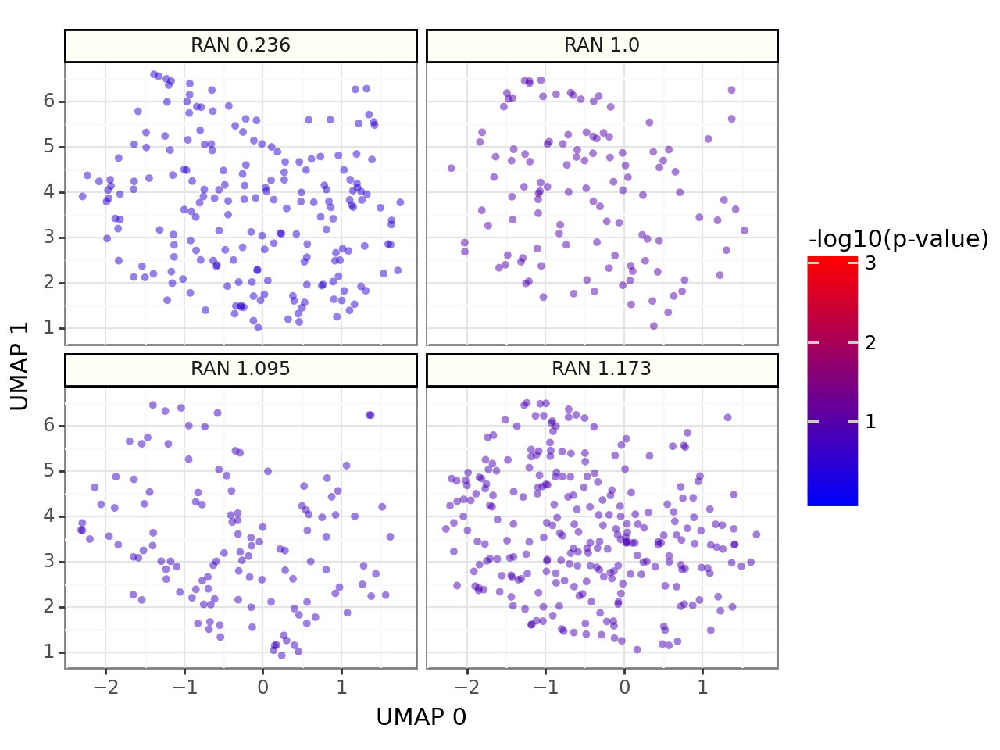

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_POLR2H_singlecell_umap_map_pval.png


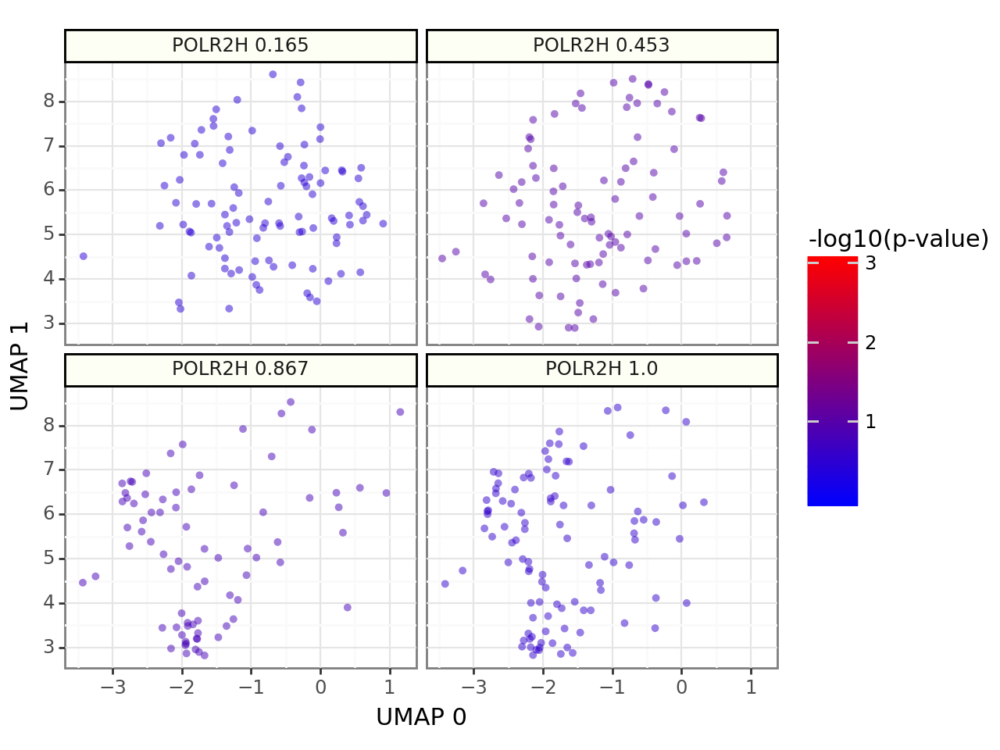

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_TUBB_singlecell_umap_map_pval.png


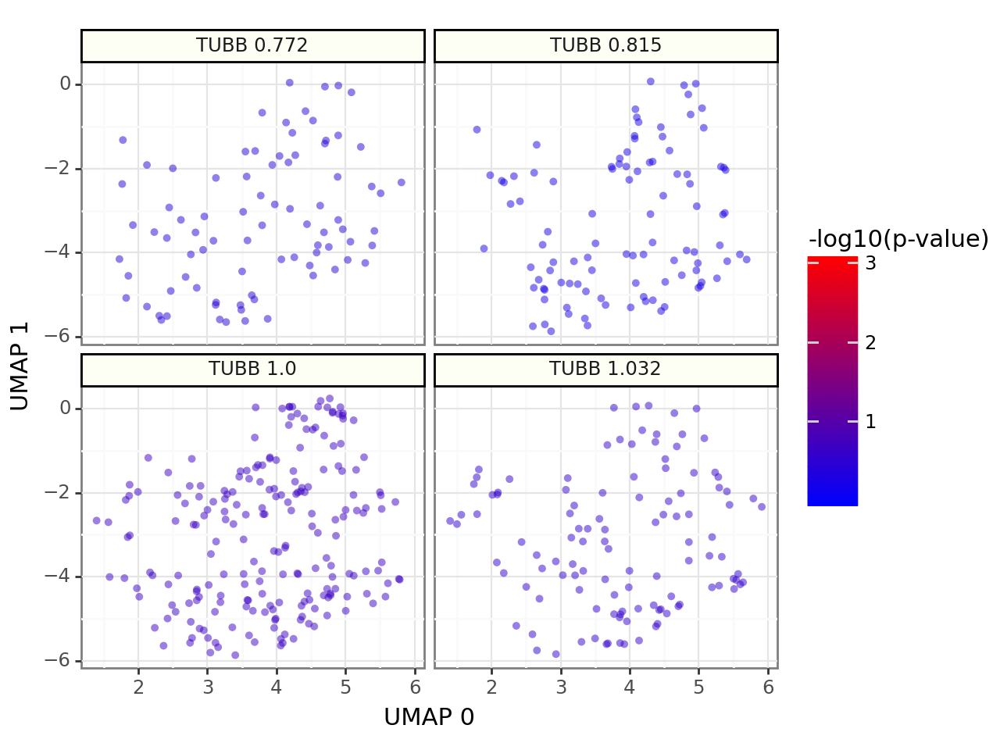

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_TUBB_singlecell_umap_expression.png


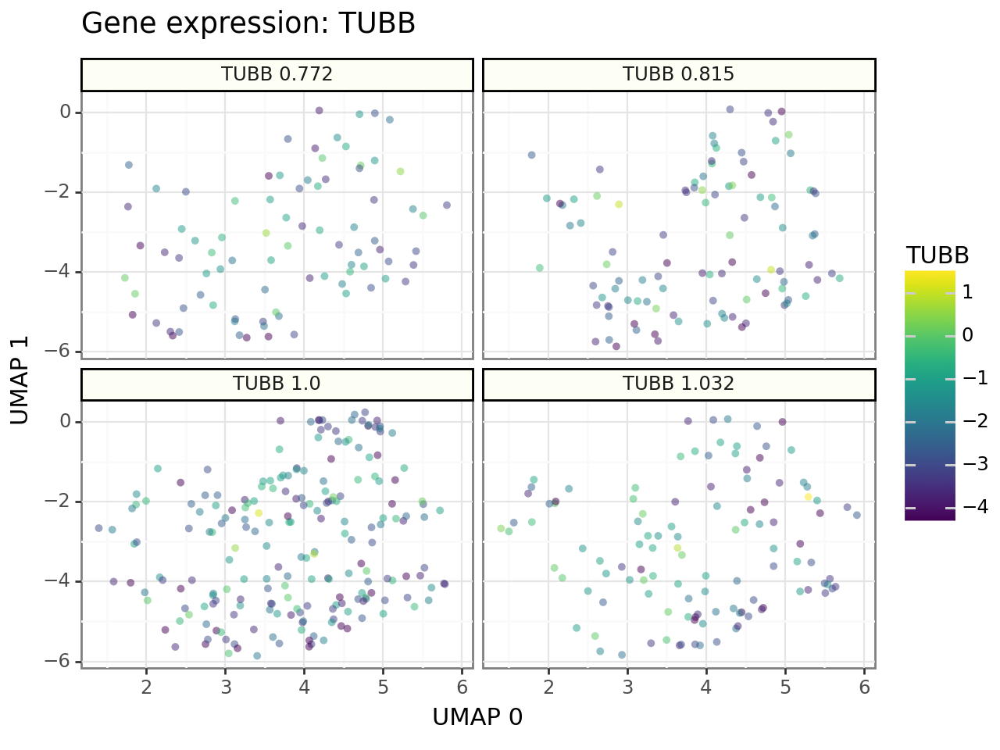

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_CDC23_singlecell_umap_map_pval.png


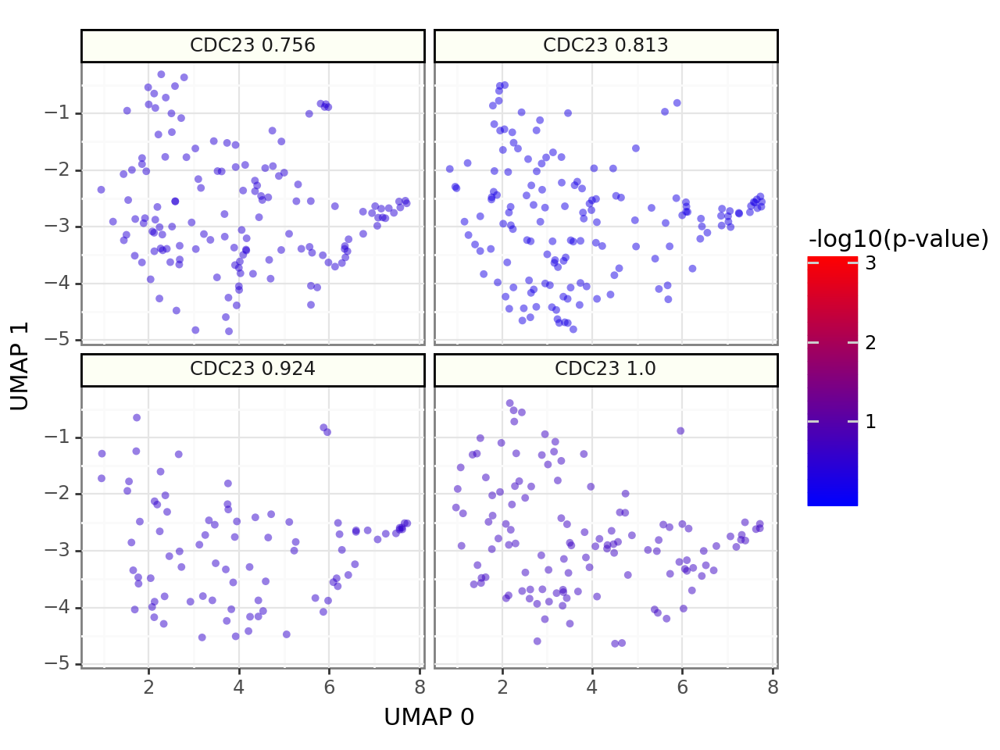

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_POLR1D_singlecell_umap_map_pval.png


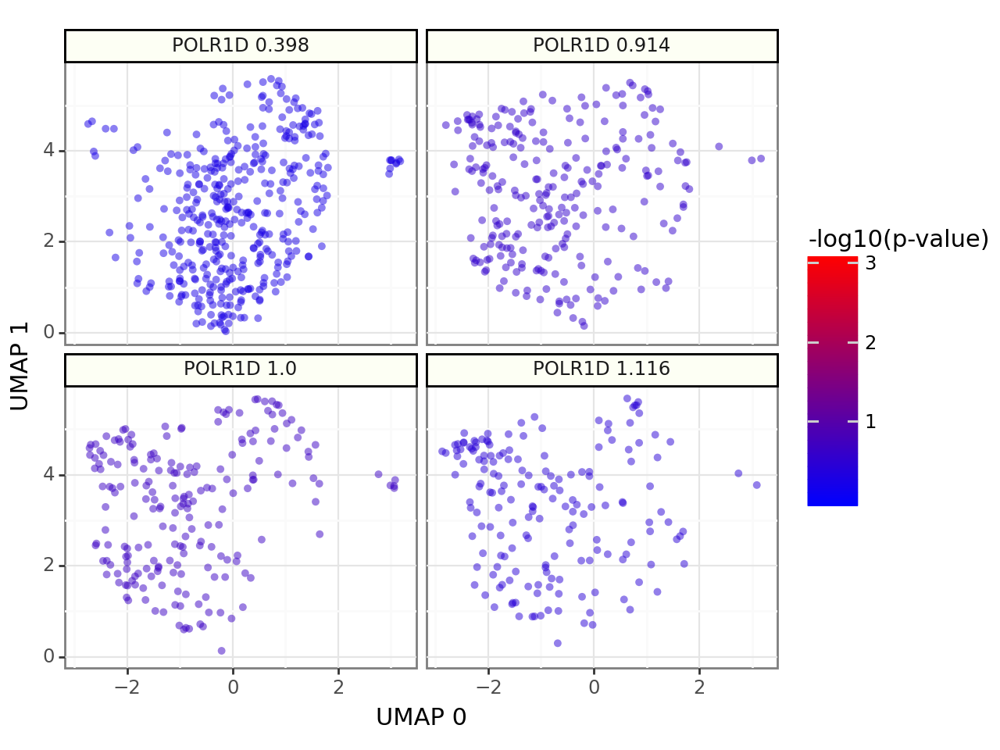

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_DUT_singlecell_umap_map_pval.png


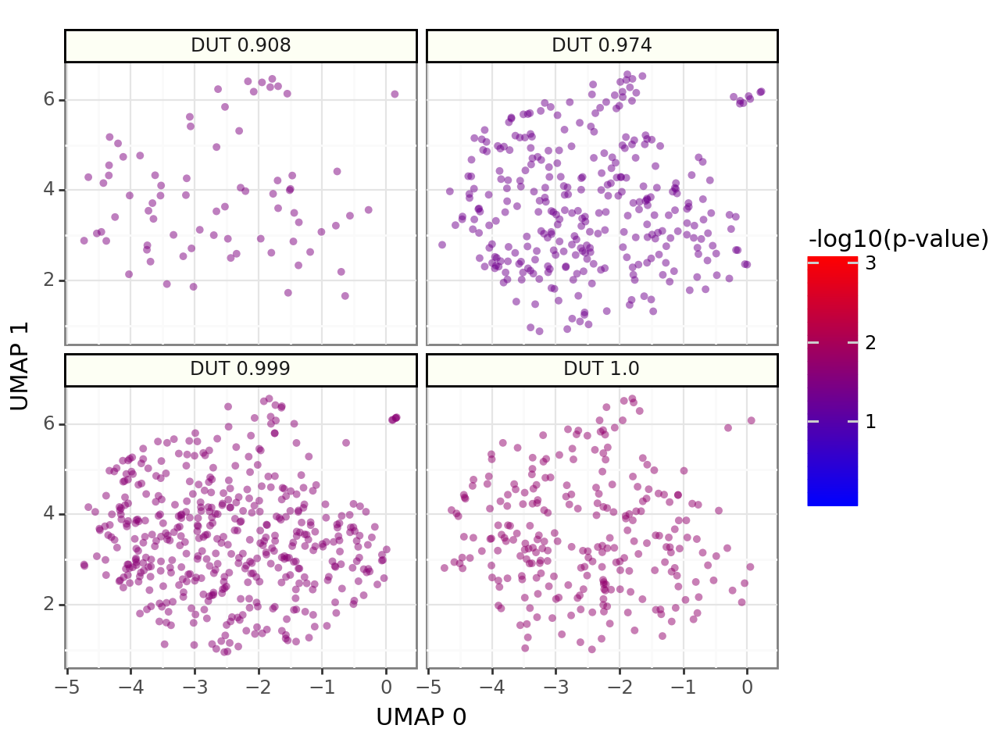

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_DUT_singlecell_umap_expression.png


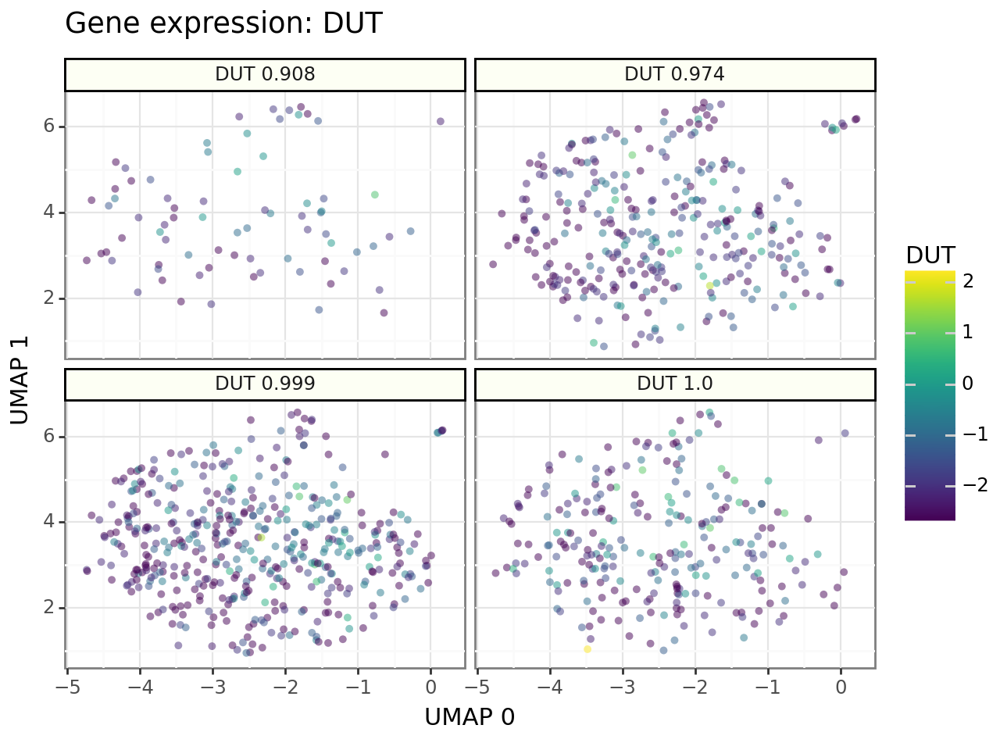

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_HSPA5_singlecell_umap_map_pval.png


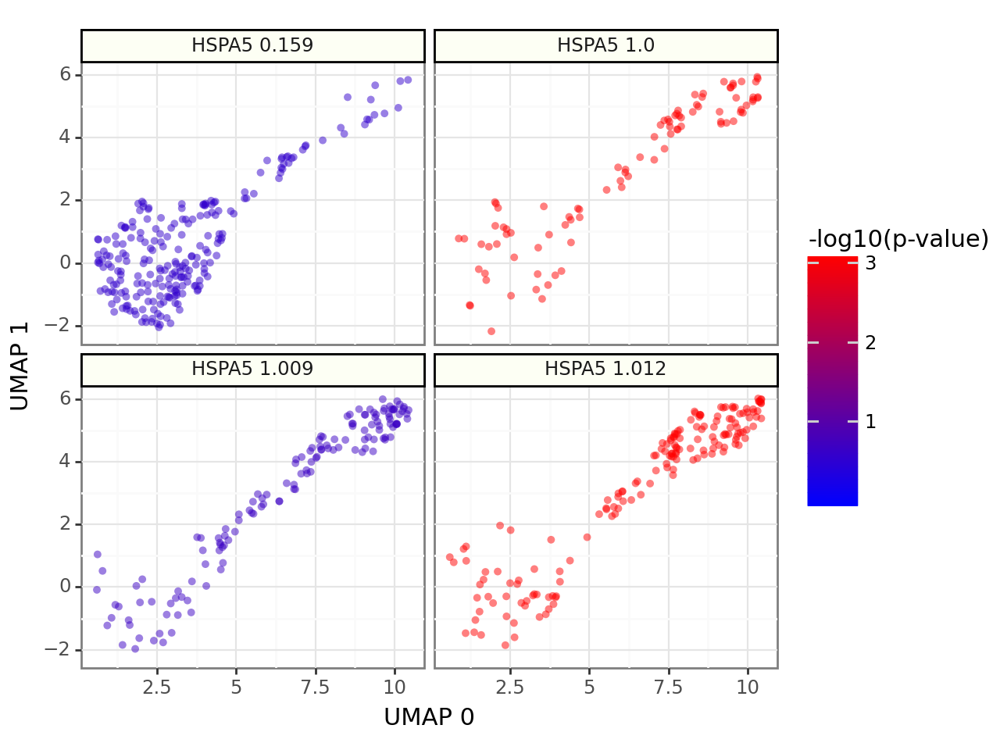

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_HSPA5_singlecell_umap_expression.png


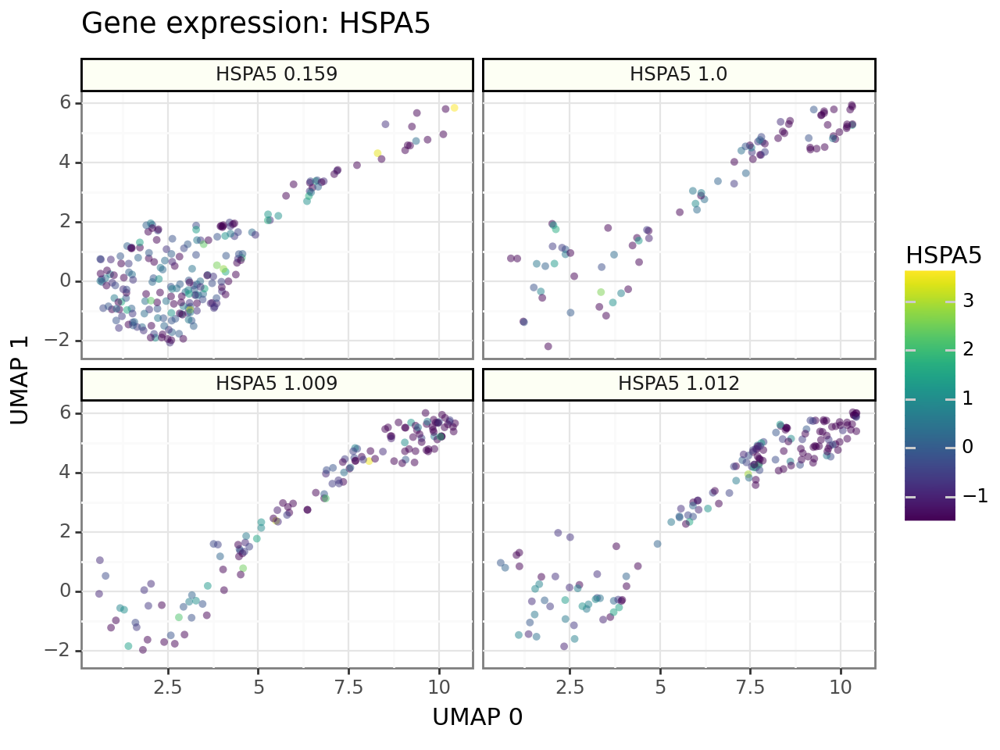

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_MTOR_singlecell_umap_map_pval.png


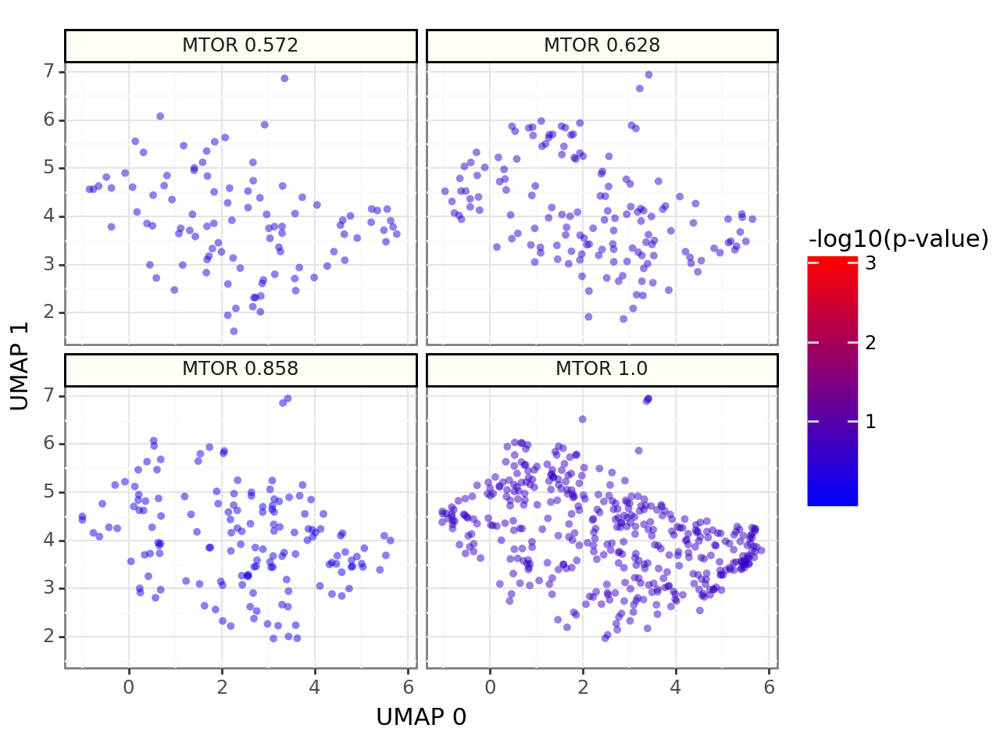

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_GATA1_singlecell_umap_map_pval.png


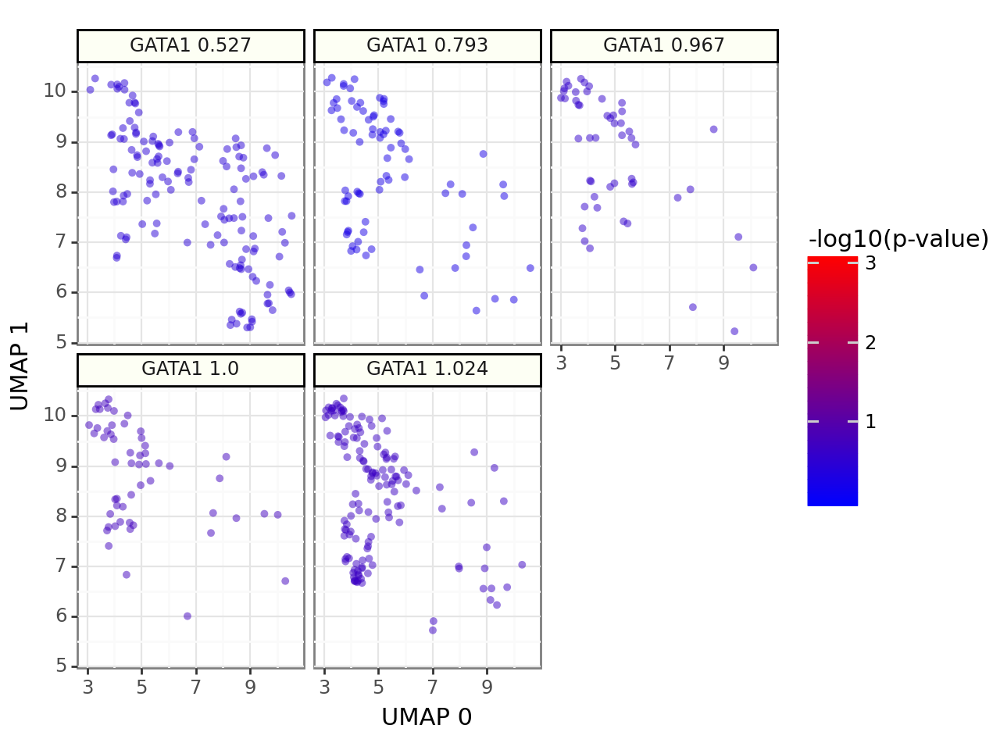

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_GINS1_singlecell_umap_map_pval.png


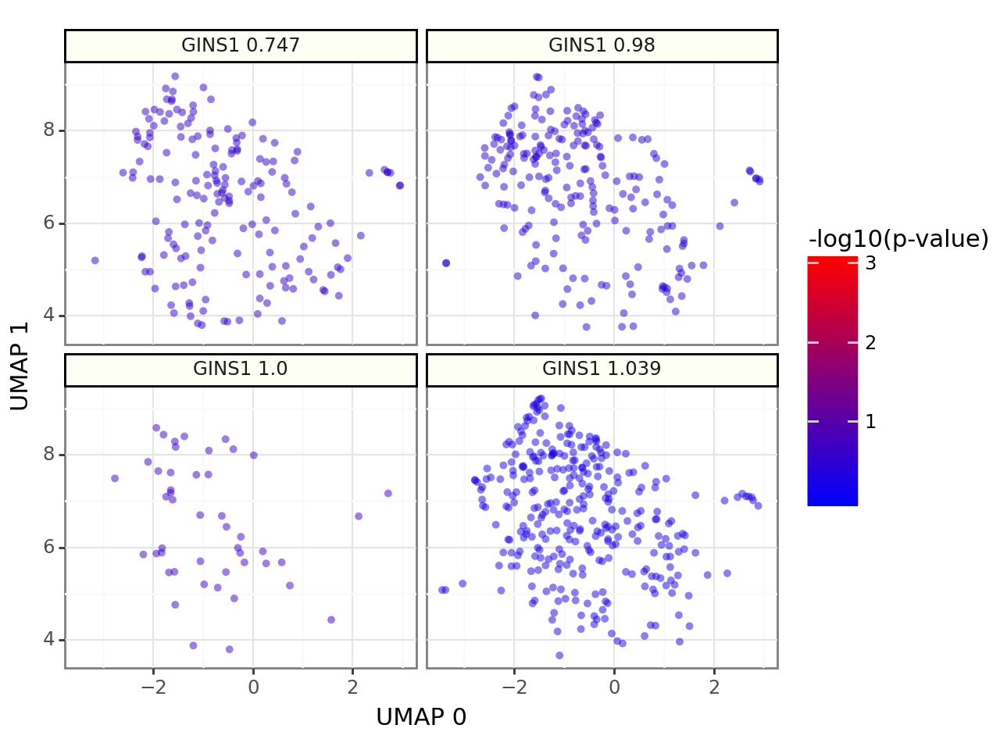

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_HSPE1_singlecell_umap_map_pval.png


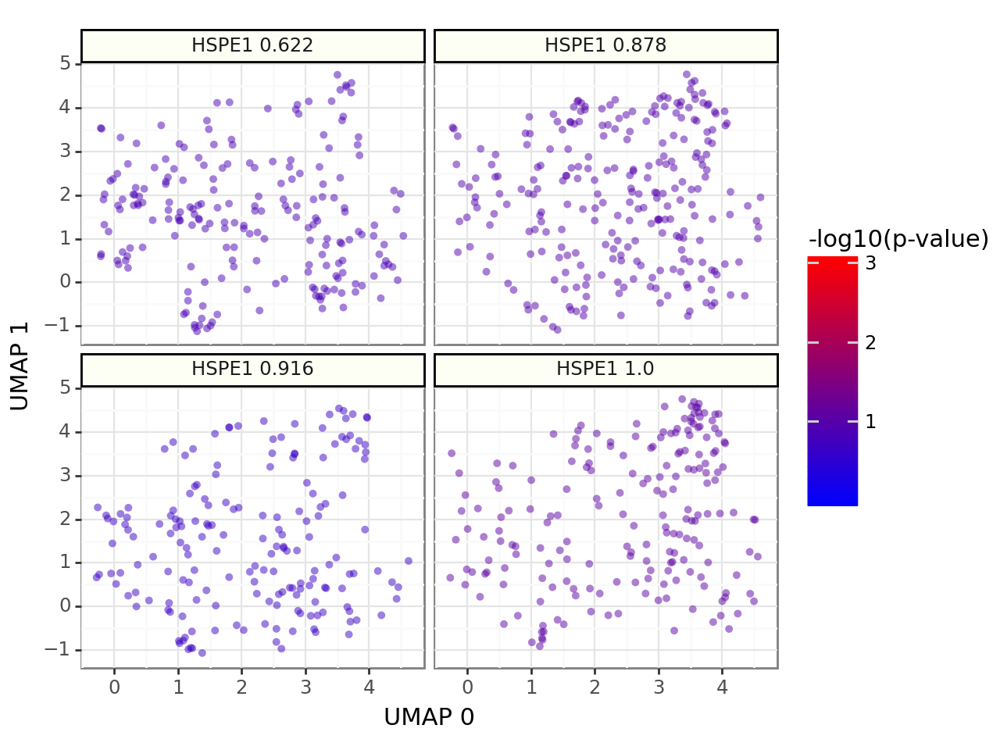

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_HSPE1_singlecell_umap_expression.png


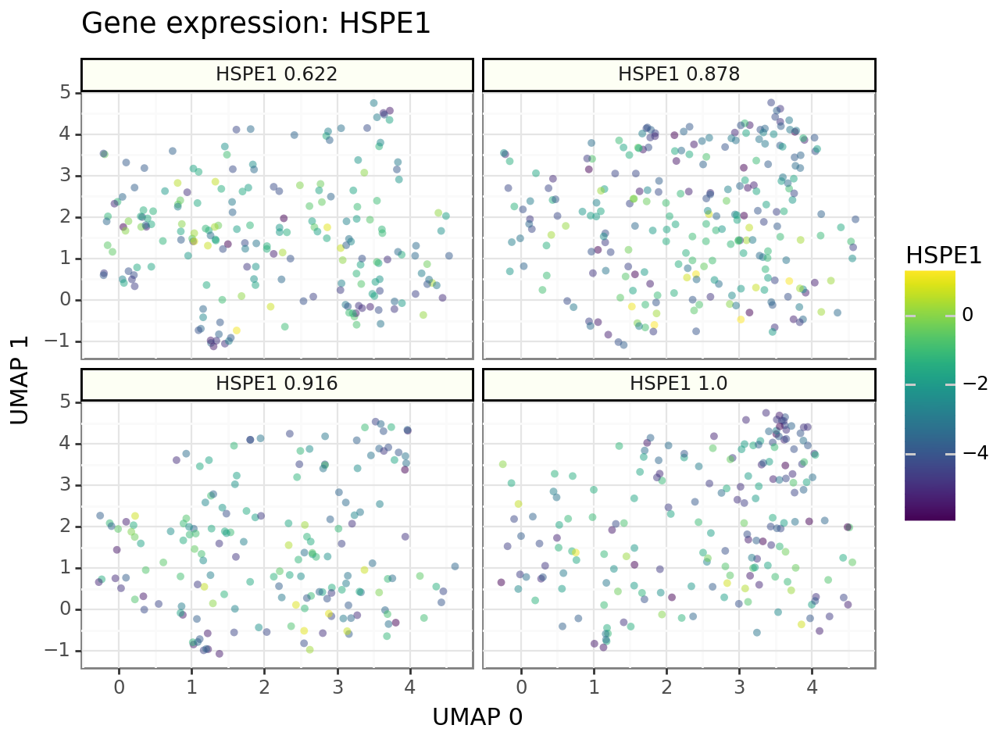

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_RPS14_singlecell_umap_map_pval.png


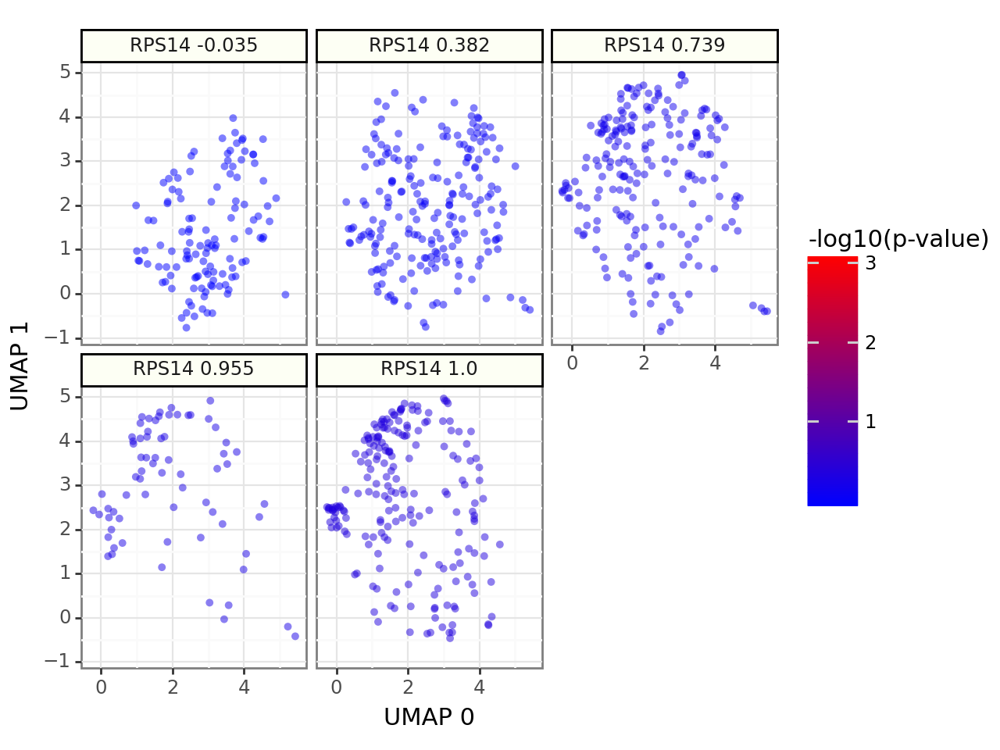

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_EIF2S1_singlecell_umap_map_pval.png


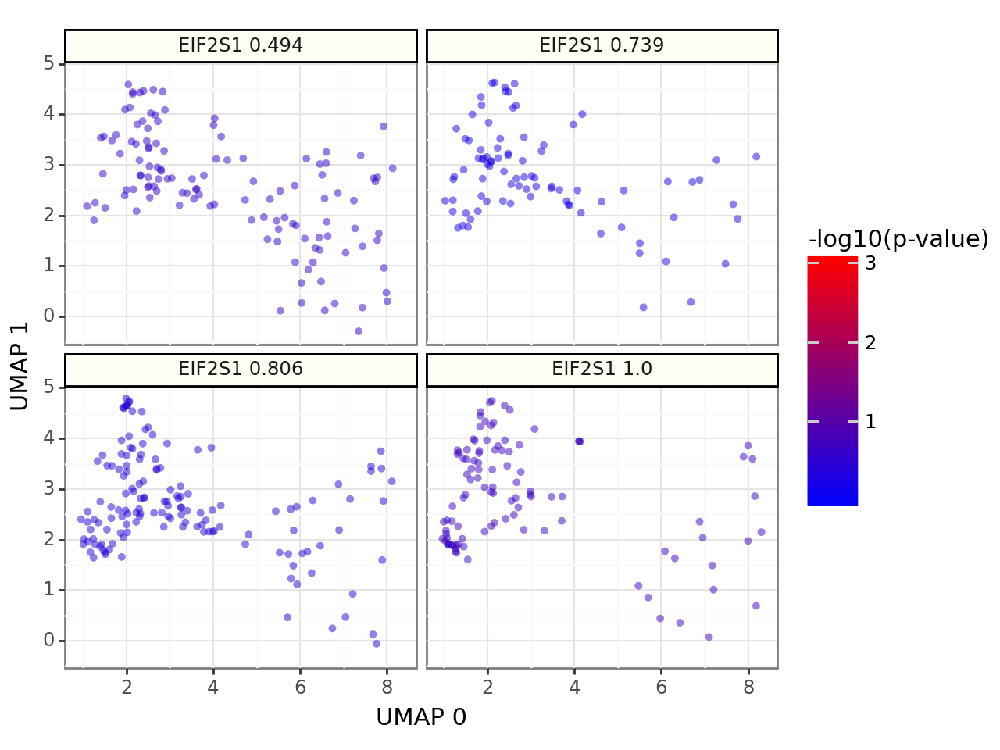

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_DBR1_singlecell_umap_map_pval.png


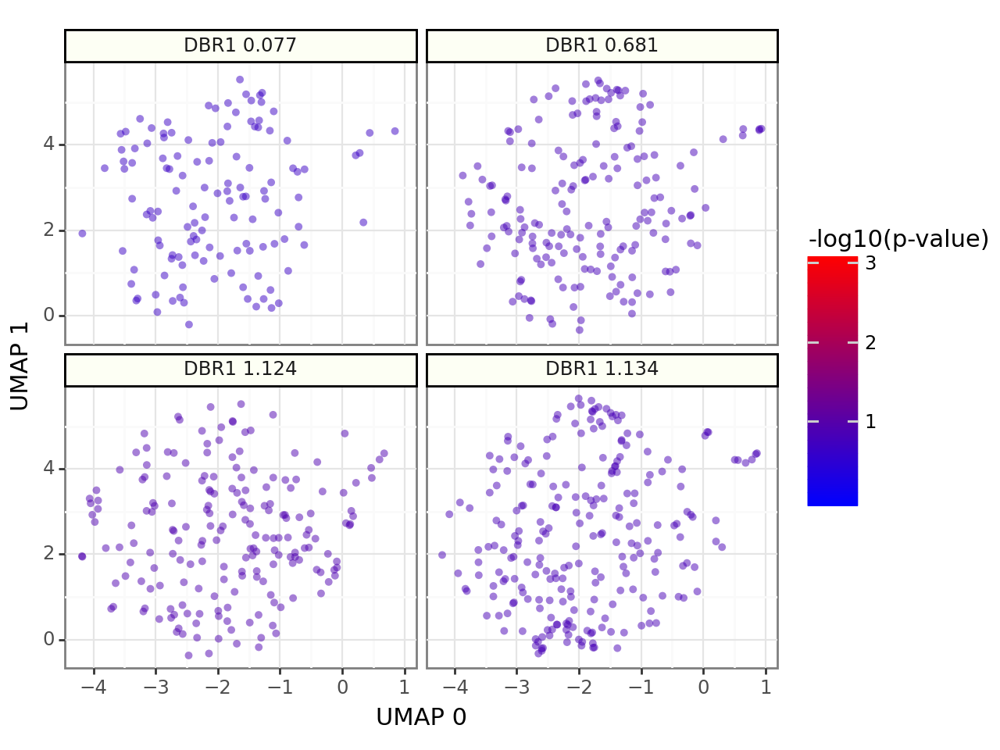

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_CAD_singlecell_umap_map_pval.png


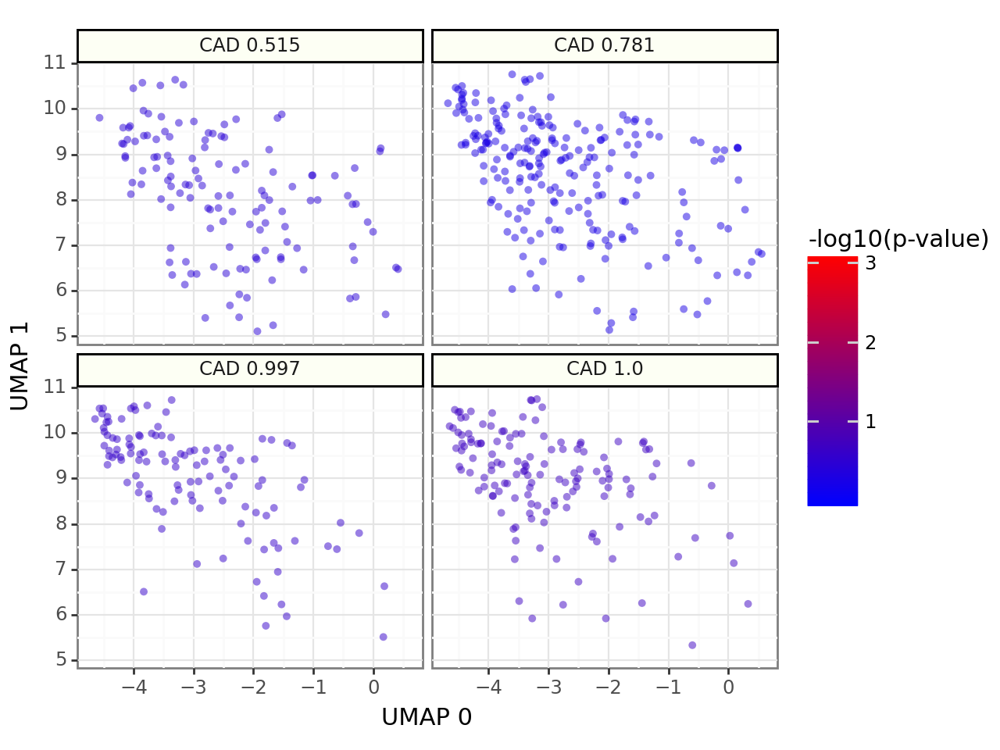

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_SEC61A1_singlecell_umap_map_pval.png


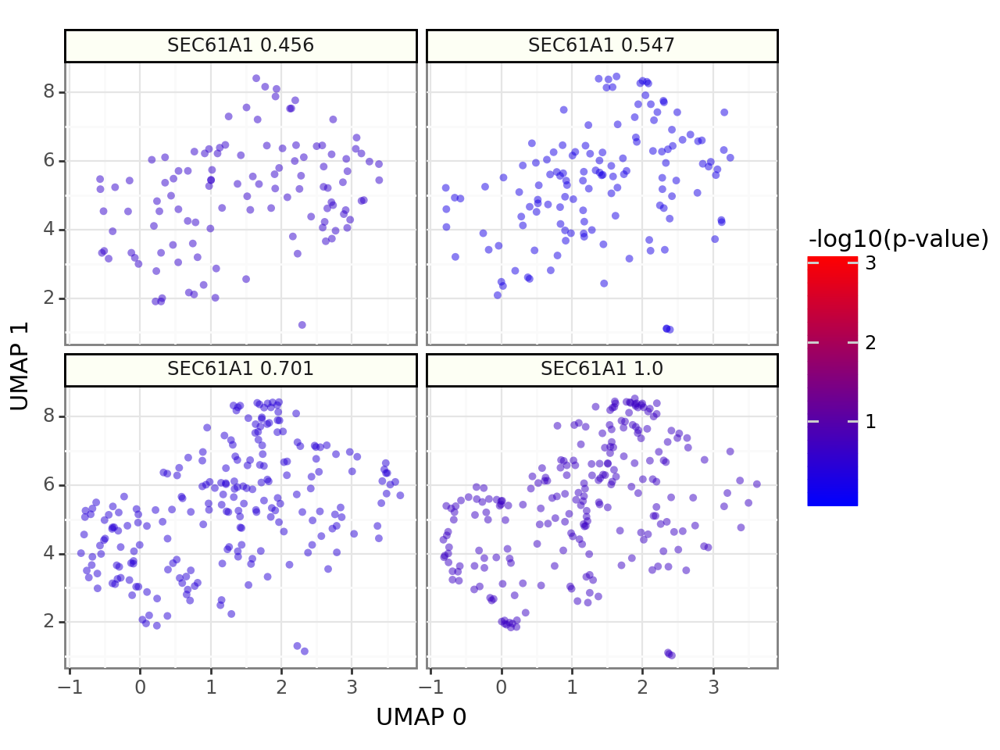

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_RPL9_singlecell_umap_map_pval.png


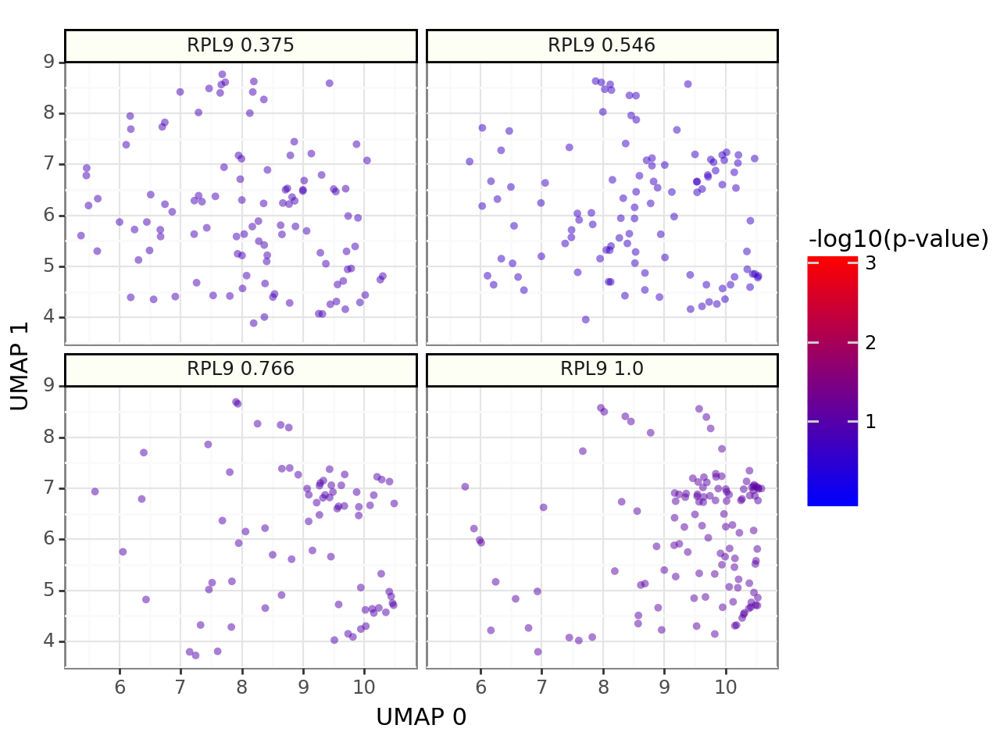

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_HSPA9_singlecell_umap_map_pval.png


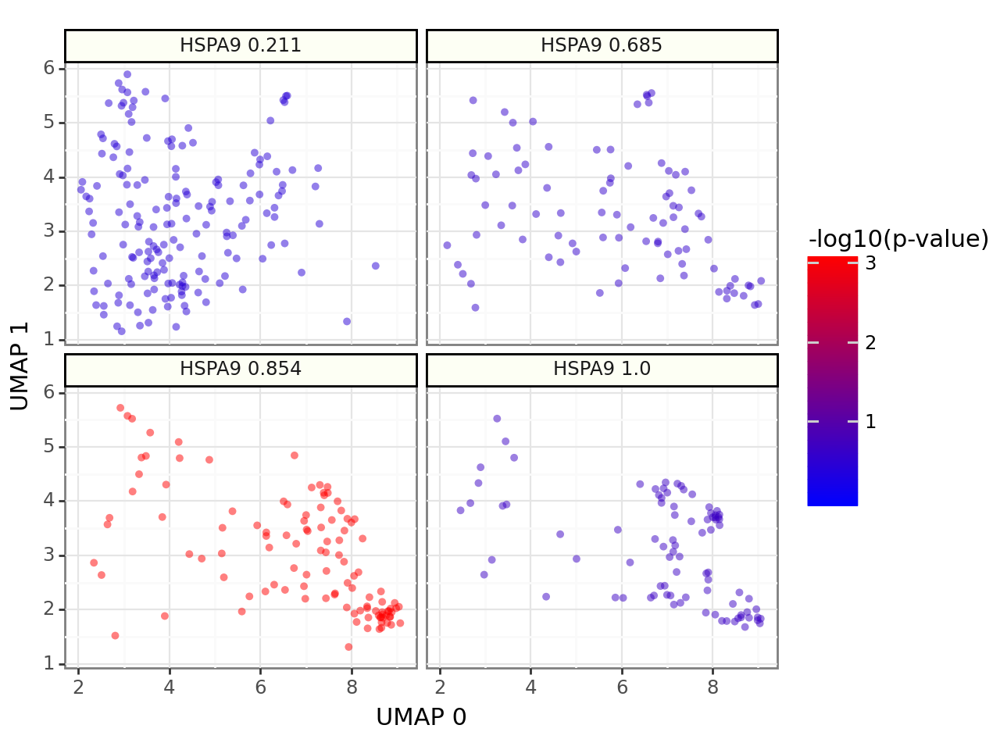

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_RPS18_singlecell_umap_map_pval.png


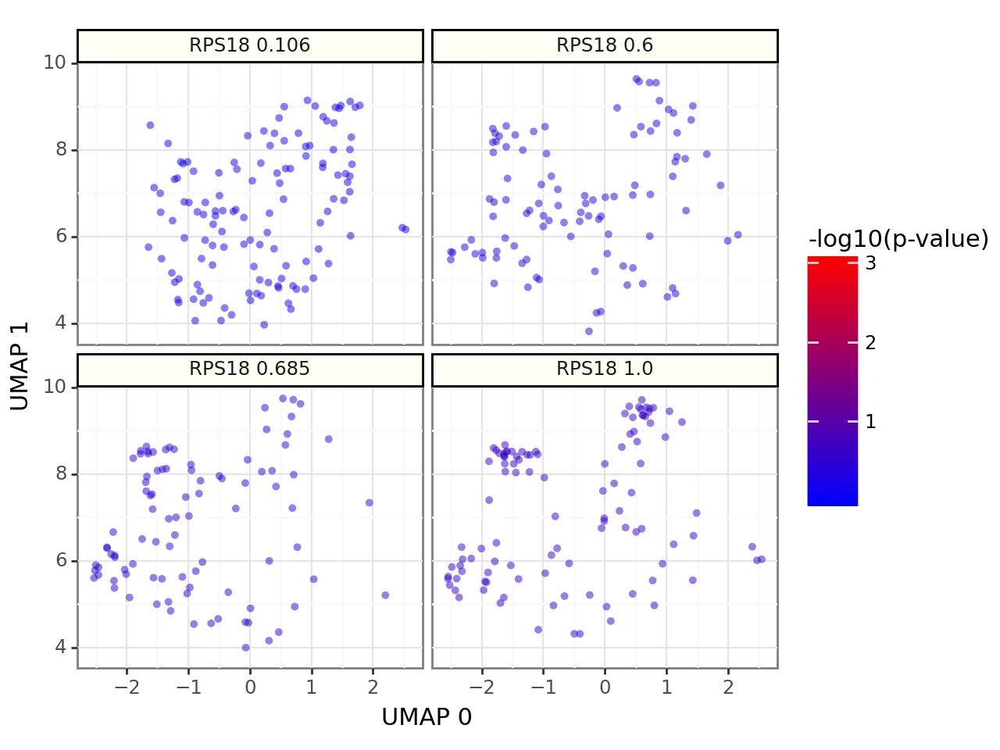

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_ALDOA_singlecell_umap_map_pval.png


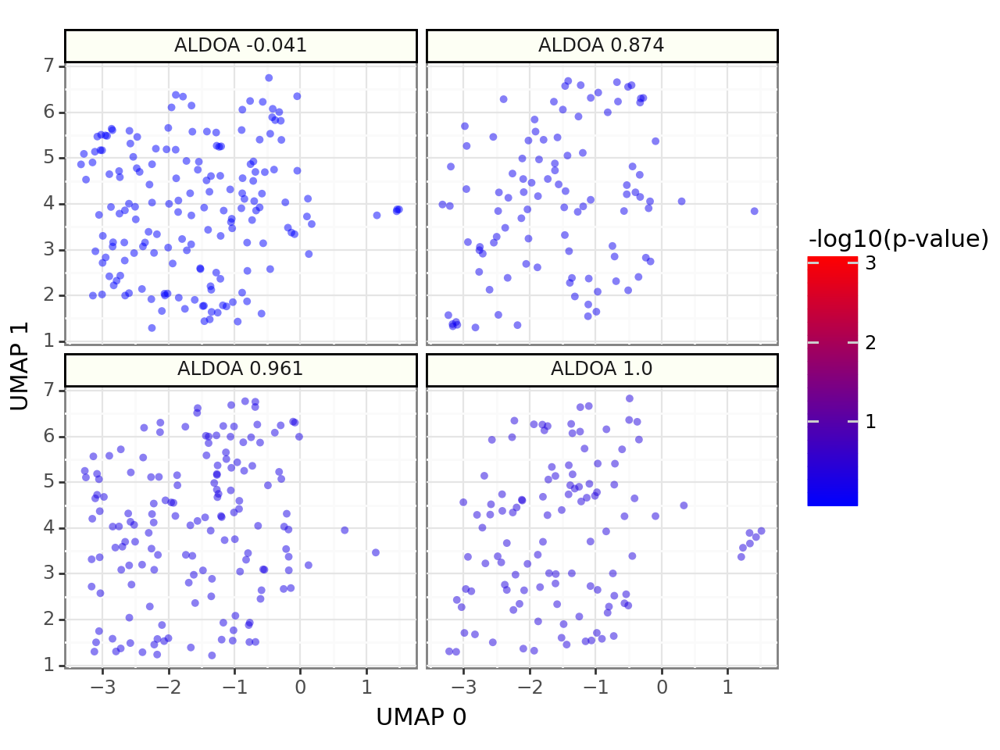

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_RPS15_singlecell_umap_map_pval.png


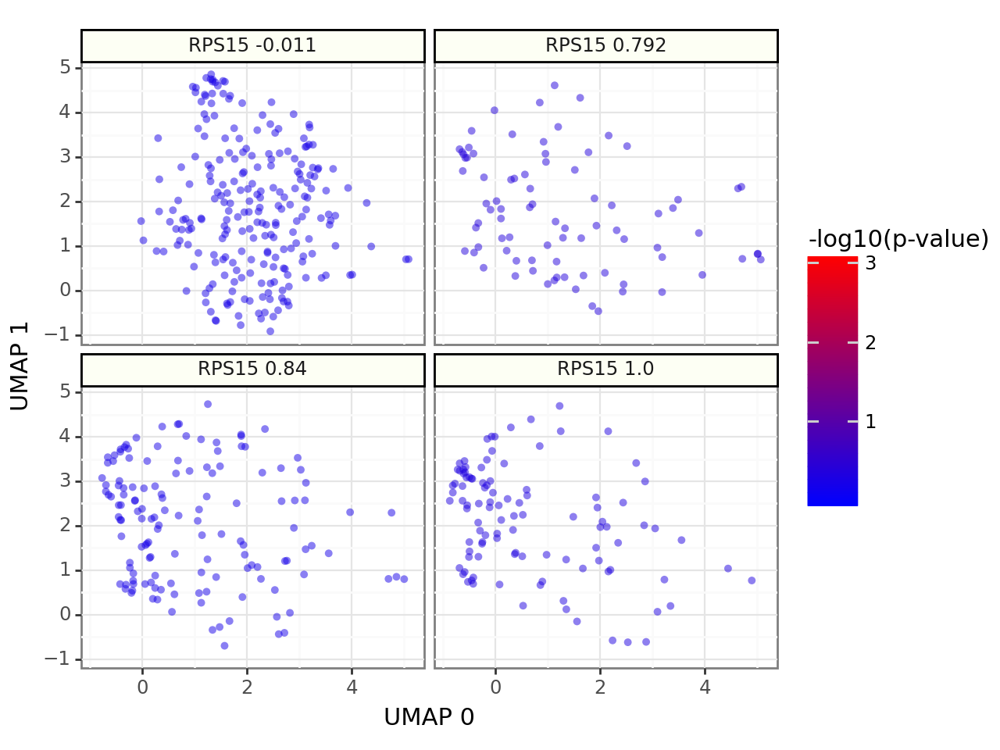

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_ATP5E_singlecell_umap_map_pval.png


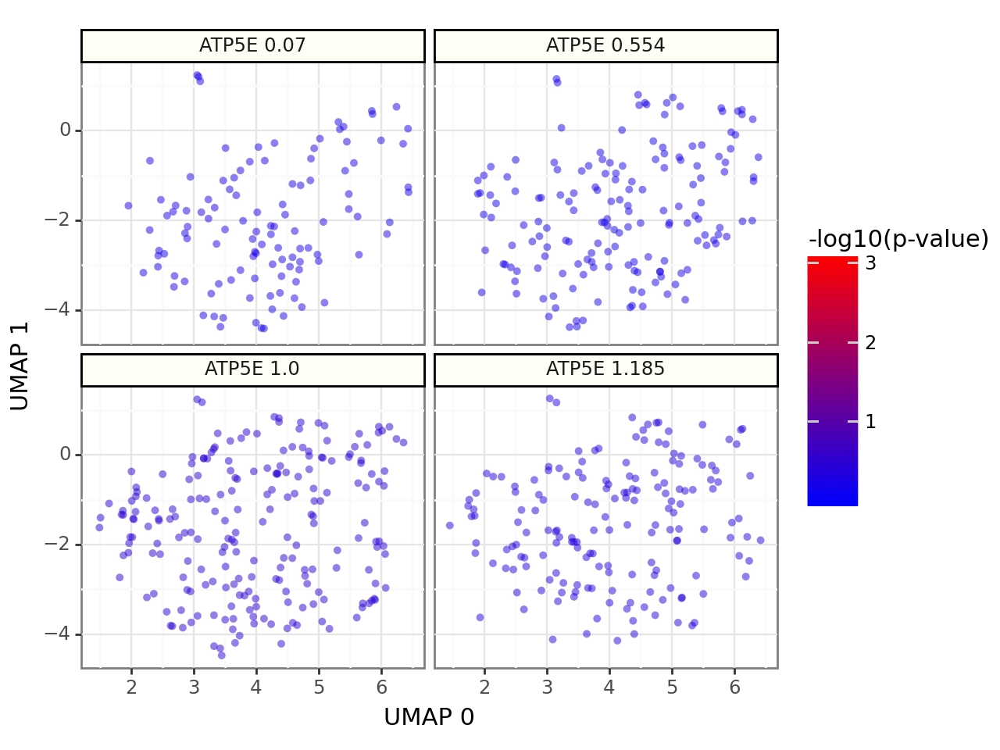

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_COX11_singlecell_umap_map_pval.png


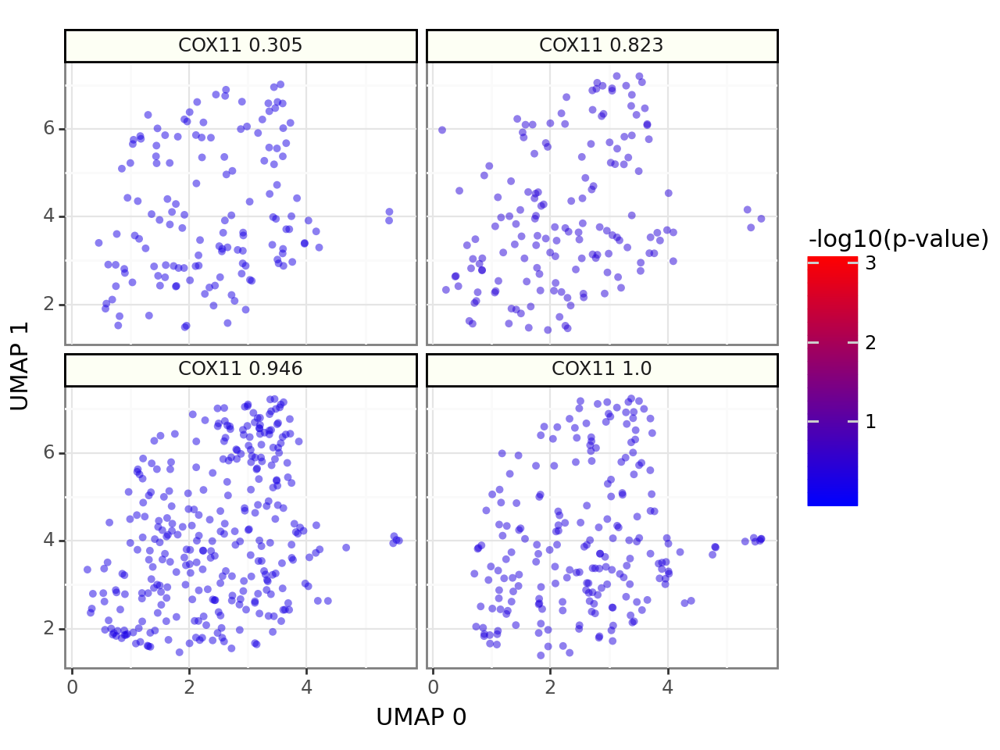

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_BCR_singlecell_umap_map_pval.png


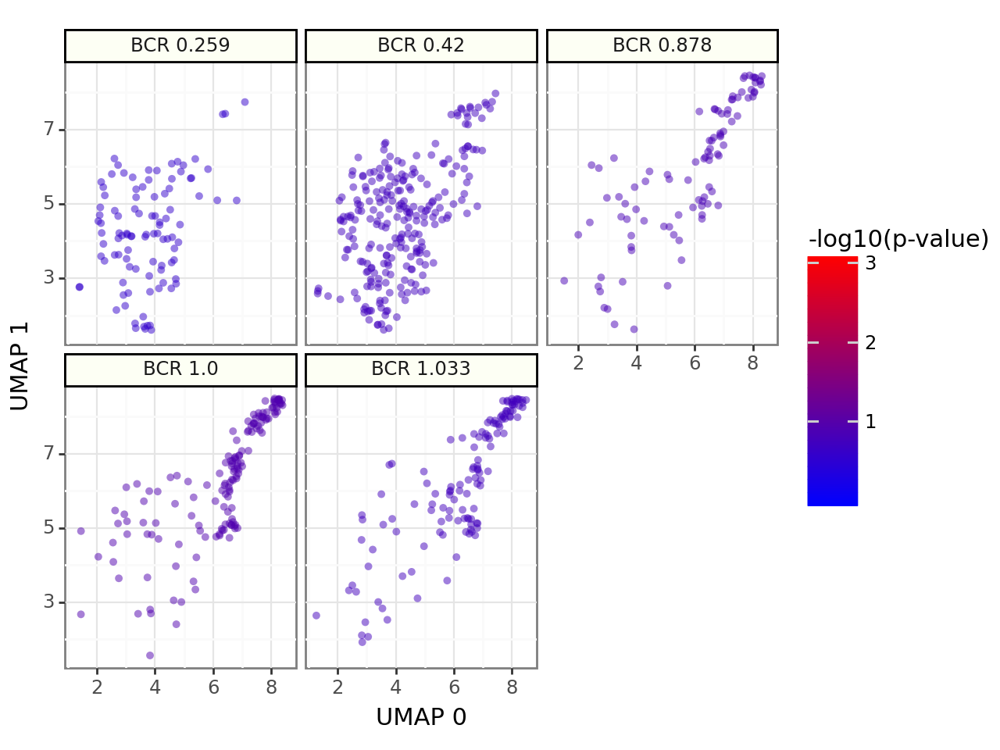

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_GNB2L1_singlecell_umap_map_pval.png


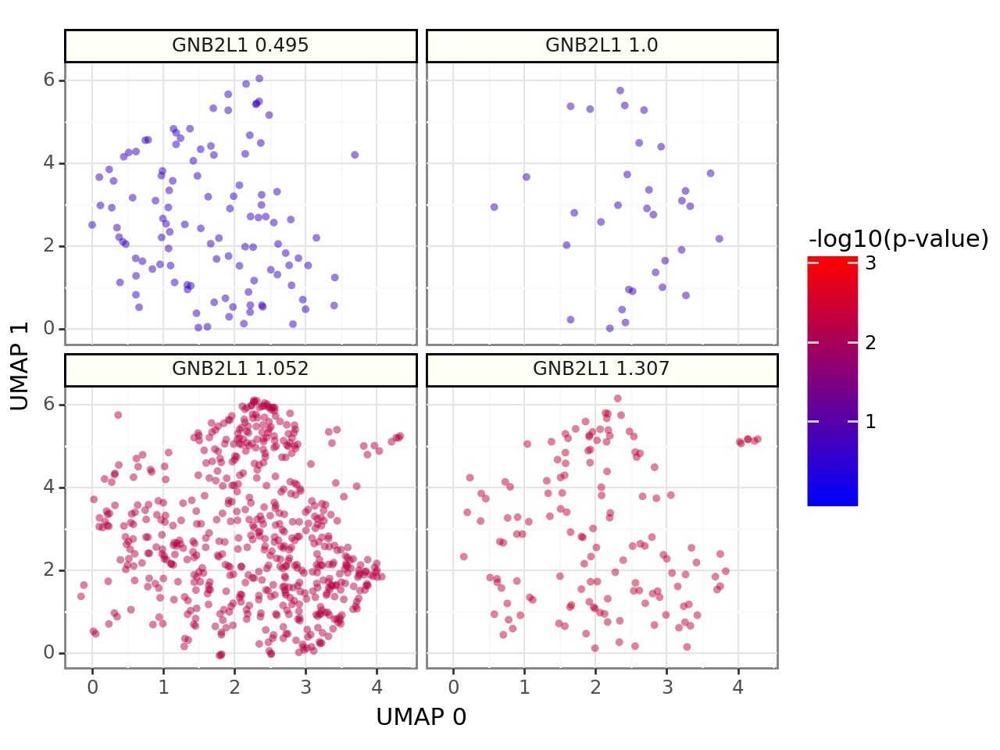

/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 5 in image.
/dgx1nas1/storage/data/akalinin/miniconda3/envs/map_benchmark/lib/python3.9/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: figures/gene_umaps/GSE132080_GNB2L1_singlecell_umap_expression.png


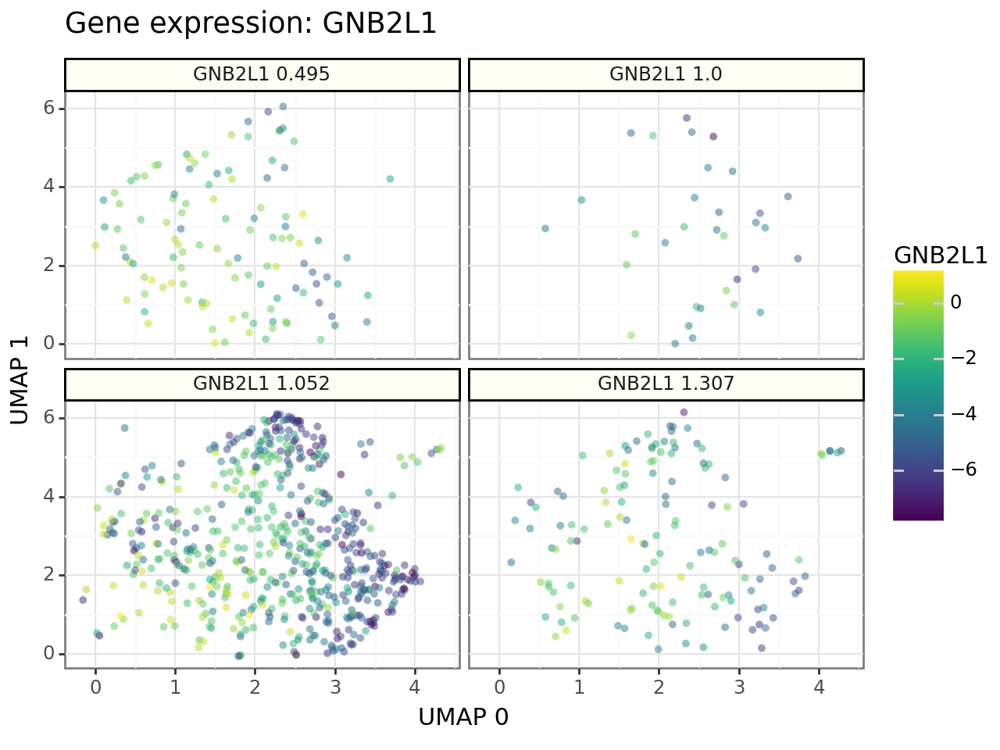

In [ ]:
min_pval = sc_df["-log10(p-value)"].min()
max_pval = sc_df["-log10(p-value)"].max()


for gene in sc_df.gene.unique():
    if gene in ["neg", "*", "nan", np.nan]:
        continue

    gene_embedding_df = sc_df.query("grit_gene == @gene")

    gene_embedding_df = gene_embedding_df.assign(
        grit_facet_label=(
            gene_embedding_df.grit_gene + " " + gene_embedding_df.relative_activity_day5.round(3).astype(str)
        )
    )

    # Setup data frame for plotting
    gene_embedding_df.loc[gene_embedding_df.Metadata_gene_identity == "neg", "grit_facet_label"] = "Negative Ctrl"
    facet_order = ["Negative Ctrl"] + [
        f"{gene_embedding_df.grit_gene.unique()[0]} " + str(x)
        for x in sorted(gene_embedding_df.relative_activity_day5.dropna().unique().round(3))
    ]
    gene_embedding_df.loc[:, "grit_facet_label"] = pd.Categorical(
        gene_embedding_df.grit_facet_label, categories=facet_order
    )

    gene_gg = (
        gg.ggplot(
            gene_embedding_df.dropna(subset=["grit_facet_label"]),
            gg.aes(x="umap_0", y="umap_1"),
        )
        + gg.geom_point(gg.aes(color="-log10(p-value)"), size=2, stroke=0, alpha=0.5)
        + gg.facet_wrap("~grit_facet_label")
        + gg.theme_bw()
        + gg.xlab("UMAP 0")
        + gg.ylab("UMAP 1")
        + gg.theme(strip_background=gg.element_rect(colour="black", fill="#fdfff4"))
        + gg.scale_color_gradient(limits=(min_pval, max_pval), low="blue", high="red")
    )

    output_file = pathlib.Path(f"{output_dir}/gene_umaps/{gse_id}_{gene}_singlecell_umap_map_pval.png")
    gene_gg.save(output_file, dpi=500, height=5, width=6)
    print(gene_gg)

    # Some genes were also directly measured. How does the expression of these look in UMAP space?
    if gene in sc_gene_exp_df.columns:
        meta_merge_cols = [x for x in sc_gene_exp_df.columns if x.startswith("Metadata_")]
        sc_geneexp_embed_df = gene_embedding_df.merge(sc_gene_exp_df, on=meta_merge_cols, how="left")

        geneexp_gg = (
            gg.ggplot(
                sc_geneexp_embed_df.dropna(subset=["grit_facet_label"]),
                gg.aes(x="umap_0", y="umap_1"),
            )
            + gg.geom_point(gg.aes(color=gene), size=2, stroke=0, alpha=0.5)
            + gg.ggtitle(f"Gene expression: {gene}")
            + gg.facet_wrap("~grit_facet_label")
            + gg.theme_bw()
            + gg.xlab("UMAP 0")
            + gg.ylab("UMAP 1")
            + gg.theme(strip_background=gg.element_rect(colour="black", fill="#fdfff4"))
        )

        output_file = pathlib.Path(f"{output_dir}/gene_umaps/{gse_id}_{gene}_singlecell_umap_expression.png")
        geneexp_gg.save(output_file, dpi=500, height=5, width=6)
        print(geneexp_gg)